In [1]:
%matplotlib notebook

#from ipywidgets import *
import os, sys, glob, time
from collections import defaultdict
from copy import copy
import numpy as np
import h5py
import pickle as pl
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from scipy import signal
from scipy.sparse import csr_matrix
from numpy.polynomial import Legendre
from scipy.special import legendre, eval_legendre
from scipy.ndimage import gaussian_filter, gaussian_filter1d
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

sys.path.append("/reg/neh/home5/khegazy/baseTools/UEDanalysis/modules")
sys.path.append("/reg/neh/home5/khegazy/baseTools/modules")
sys.path.append("../../")
from data_handling import *
from fitting import *
from data_retrieval import *
from parameters import get_parameters

In [29]:
run = "fullRevival"
params = get_parameters(run)

q = np.arange(params.NradAzmBins)*params.QperPix


rad_inds = get_pixel_shells(params.NradAzmBins+1)
scans, images, nanMaps, stage_pos, image_nums, image_norms,\
centers, center_stdRs, isRefs = get_images(
        params.molName, run, scans=None, skip=[171,321], form=params.data_format)

# Adding Scan 171 with a different number of images
scans_171, images_171, nanMaps_171, stage_pos_171, image_nums_171,\
image_norms_171, centers_171, center_stdRs_171, isRefs_171 = get_images(
        params.molName, params.run, scans=171, form=params.data_format)


fName = os.path.join(params.simOutputDir, "{0}_sim_diffraction-azmAvg_align-random_Qmax-{1:.4g}.h5".format(
        params.molName, params.QperPix*(params.NradAzmBins-1)))
with h5py.File(fName, 'r') as hf:
    atm_scattering = hf["atm_diffraction"][:]
    mol_scattering = hf["mol_diffraction"][:]
    sms_scattering = hf["sms_diffraction"][:]

Scans:  [211 221 231 232 233 234 311 312 313 314 331 332 333 334]
Getting Images
Getting nanMaps
Getting stage positions
Getting image number
Getting image normalization
Getting image centers
Getting image centers
Getting image reference indicator
Scans:  [171]
Getting Images
Getting nanMaps
Getting stage positions
Getting image number
Getting image normalization
Getting image centers
Getting image centers
Getting image reference indicator


## Basic Cuts

In [33]:
def cut_image_norm(norm_range, image_norms, nanMaps):
    mask = np.where(np.logical_or(image_norms < norm_range[0], image_norms > norm_range[1]))
    nanMaps[mask[0],mask[1],:,:] = 1
    return nanMaps

def cut_center_stdR(cut_val, stdR, nanMaps):
    mask = np.where(np.any(stdR > cut_val, axis=-1))
    nanMaps[mask[0],mask[1],:,:] = 1
    return nanMaps 
nanMaps = cut_image_norm([16.5, 22], image_norms, nanMaps)
nanMaps = cut_center_stdR(2.5, center_stdRs, nanMaps)
nanMaps_171 = cut_image_norm([16.5, 22], image_norms_171, nanMaps_171)
nanMaps_171 = cut_center_stdR(2.5, center_stdRs_171, nanMaps_171)

# Reference Image

In [34]:
ref_scans, ref_images, ref_nanMaps, ref_stage_pos, ref_image_nums,\
ref_image_norms, ref_centers, ref_center_stdRs, ref_isRefs = get_images(params.molName, params.run, scans=321)

ref_nanMaps = cut_image_norm([16.5, 22], ref_image_norms, ref_nanMaps)
ref_nanMaps = cut_center_stdR(2.5, ref_center_stdRs, ref_nanMaps)

# Reshape [NtimeSteps, image_rows, image_cols]
ref_images = np.reshape(ref_images, (-1, ref_images.shape[-2], ref_images.shape[-1]))
ref_nanMaps = np.reshape(ref_nanMaps, (-1, ref_nanMaps.shape[-2], ref_nanMaps.shape[-1]))
ref_centers = np.reshape(ref_centers, (-1, ref_centers.shape[-1]))

Scans:  [321]
Getting Images
Getting nanMaps
Getting stage positions
Getting image number
Getting image normalization
Getting image centers
Getting image centers
Getting image reference indicator


In [36]:
ref_radial_pixels = []
ref_radial_stds   = []
ref_radial_nanMap = []
for rad in range(params.NradAzmBins):
    img_inds, row_inds, col_inds = [], [], []
    for im in range(ref_images.shape[0]):
        img_inds.append(np.ones(rad_inds[rad][0].shape[0], dtype=int)*im)
        row_inds.append(rad_inds[rad][0]+ref_centers[im,0])
        col_inds.append(rad_inds[rad][1]+ref_centers[im,1])
    img_inds = np.concatenate(img_inds)
    row_inds = np.concatenate(row_inds)
    col_inds = np.concatenate(col_inds)
    radial_pixels = np.reshape(ref_images[img_inds,row_inds,col_inds], (ref_images.shape[0], -1))
    radial_nanMap = np.reshape(ref_nanMaps[img_inds,row_inds,col_inds], (ref_images.shape[0], -1))
    
    # std Cut
    mask = np.ones_like(radial_pixels)
    mask[radial_nanMap.astype(bool)] = np.nan
    for istd in range(3):
        mean = np.nanmean(radial_pixels*mask, axis=0)
        std  = np.nanstd(radial_pixels*mask, axis=0)
        std[std==0.0] = np.sqrt(np.abs(mean[std==0.0]))
          
        # Cut pixels 
        mask[np.abs(mean-radial_pixels) > 2.5*std] = np.nan
        radial_nanMap[np.abs(mean-radial_pixels) > 2.5*std] = 1
    
    # Merge values
    radial_pixels[radial_nanMap.astype(bool)] = np.nan
    radial_stds = np.zeros_like(radial_pixels)
    radial_stds[radial_nanMap.astype(bool)] = np.nan
    radial_stds = np.nanstd(radial_pixels, 0)
    radial_pixels = np.nanmean(radial_pixels, 0)
    radial_pixels[np.all(radial_nanMap.astype(bool), axis=0)] = 0
    
    radial_stds[np.all(radial_nanMap.astype(bool), axis=0)] = 0
    if np.any(np.isnan(radial_pixels)):
        print("ERROR: DO NOT EXPECT ANY NANS!!!")
    ref_radial_pixels.append(radial_pixels)
    ref_radial_stds.append(radial_stds)
    ref_radial_nanMap.append(np.all(radial_nanMap.astype(bool), axis=0))
    
        

/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:20: RuntimeWarning: Mean of empty slice
/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:32: RuntimeWarning: Mean of empty slice


# Merge Scans

In [37]:
fName = os.path.join(params.preProcOutputDir, "Run-"+params.run, "Scan_t0Shifts.pl")
with open(fName, "rb") as file:
    shift_dict = pl.load(file)

In [39]:
min_shift = np.amin(np.array(shift_dict.values()))
max_shift = np.amin(np.array(shift_dict.values()))
data_align_dict = defaultdict(list)
nanMap_align_dict = defaultdict(list)
center_align_dict = defaultdict(list)

# Aligning by t0 shifts
for isc, sc in enumerate(scans):
    shift = shift_dict[sc]
    for i in range(images.shape[0]):
        if sc == 171:
            if i >= images_171.shape[0]:
                continue
            data_align_dict[shift+i].append(images_171[i,isc])
            nanMap_align_dict[shift+i].append(nanMaps_171[i,isc])
            center_align_dict[shift+i].append(centers_171[i,isc,:])
        else:
            data_align_dict[shift+i].append(images[i,isc])
            nanMap_align_dict[shift+i].append(nanMaps[i,isc])
            center_align_dict[shift+i].append(centers[i,isc,:])


# Combining
data_align = []
nanMap_align = []
center_align = []
for k in np.sort(np.array(list(data_align_dict.keys()))):
    data_align.append(np.array(data_align_dict[k]))
    nanMap_align.append(np.array(nanMap_align_dict[k]))
    center_align.append(np.array(center_align_dict[k]))

# Merge and Remove 3std outliers and merge
merged_images, merged_images_std, merged_images_count, nanMap_align_wcuts, images_align = merge_data(
        data_align, nanMap_align, center_align, 2.5, params.NradAzmBins, rad_inds,
        ref_rad_pixs=ref_radial_pixels, ref_rad_nans=ref_radial_nanMap, loop_std_cut=3)
merged_centers = np.array([[merged_images.shape[-2]//2, merged_images.shape[-1]//2]]*merged_images.shape[0])

/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:37: RuntimeWarning: Mean of empty slice
/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:47: RuntimeWarning: Mean of empty slice


# Fit Images with Legendres

## Fiting individual images and averaging

In [51]:
image_fits, _ = fit_legendres_images(data_align, center_align, np.array([0,2,4,6,8,10]), rad_inds, 
        params.NradAzmBins, image_nanMaps=nanMap_align, rotate=1.64)#, rad_range=[104,106])#1.644)

Fitting radius 0


/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:142: RuntimeWarning: invalid value encountered in true_divide
/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:143: RuntimeWarning: invalid value encountered in true_divide


Fitting radius 25
Fitting radius 50
Fitting radius 75
Fitting radius 100
Fitting radius 125
Fitting radius 150
Fitting radius 175
Fitting radius 200
Fitting radius 225
Fitting radius 250
Fitting radius 275
Fitting radius 300
Fitting radius 325
Fitting radius 350


In [52]:
merged_fits, merged_fits_std = [], []
for im in range(len(image_fits)):
    merged_fits_std.append(np.nanstd(image_fits[im], axis=0))
    merged_fits.append(np.nanmean(image_fits[im], axis=0))
merged_fits = np.array(merged_fits)
merged_fits_std = np.array(merged_fits_std)

/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:4: RuntimeWarning: Mean of empty slice


(40, 375, 6)


/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:2: RuntimeWarning: Mean of empty slice
  from ipykernel import kernelapp as app


<IPython.core.display.Javascript object>


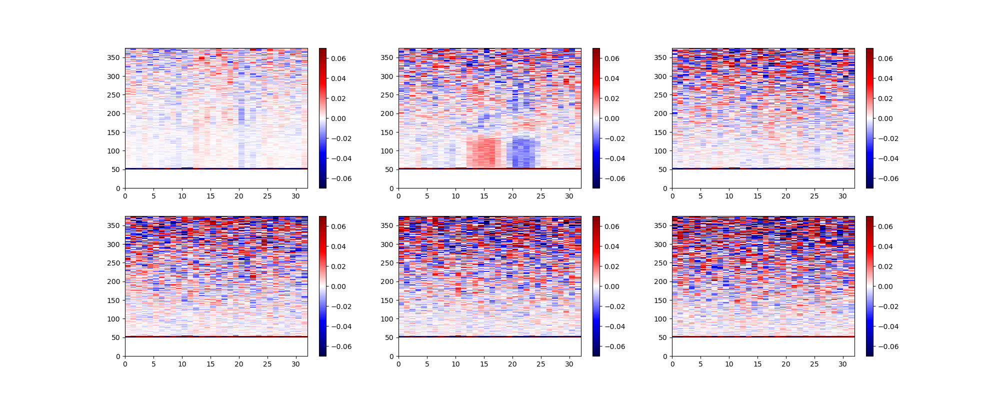

/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:12: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:14: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:16: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as 

In [53]:
final_fits = merged_fits*np.expand_dims(1./atm_scattering, -1)
final_fits -= np.expand_dims(np.nanmean(final_fits[3:-2], 0), 0)
final_stds = np.sqrt(merged_fits_std)*np.expand_dims(np.expand_dims(1./atm_scattering, -1), 0)

shape = final_fits.shape
print(shape)

tcl,tch = 4, -3
qRange = []
X,Y = np.meshgrid(np.arange(final_fits.shape[0]-tcl+tch), np.arange(final_fits.shape[1]+1))
fig,ax = plt.subplots(2,3,figsize=(20,8))
a0 = ax[0,0].pcolormesh(X, Y, final_fits[tcl:tch,:,0].transpose(), cmap='seismic',vmin=-0.07,vmax=0.07)
fig.colorbar(a0,ax=ax[0,0])
a1 = ax[0,1].pcolormesh(X, Y, final_fits[tcl:tch,:,1].transpose(), cmap='seismic',vmin=-0.07,vmax=0.07)
fig.colorbar(a1,ax=ax[0,1])
a2 = ax[0,2].pcolormesh(X, Y, final_fits[tcl:tch,:,2].transpose(), cmap='seismic',vmin=-0.07,vmax=0.07)
fig.colorbar(a2,ax=ax[0,2])
a3 = ax[1,0].pcolormesh(X, Y, final_fits[tcl:tch,:,3].transpose(), cmap='seismic',vmin=-0.07,vmax=0.07)
fig.colorbar(a3,ax=ax[1,0])
a4 = ax[1,1].pcolormesh(X, Y, final_fits[tcl:tch,:,4].transpose(), cmap='seismic',vmin=-0.07,vmax=0.07)
fig.colorbar(a4,ax=ax[1,1])
a5 = ax[1,2].pcolormesh(X, Y, final_fits[tcl:tch,:,5].transpose(), cmap='seismic',vmin=-0.07,vmax=0.07)
fig.colorbar(a5,ax=ax[1,2])


(40, 375, 6)


<IPython.core.display.Javascript object>


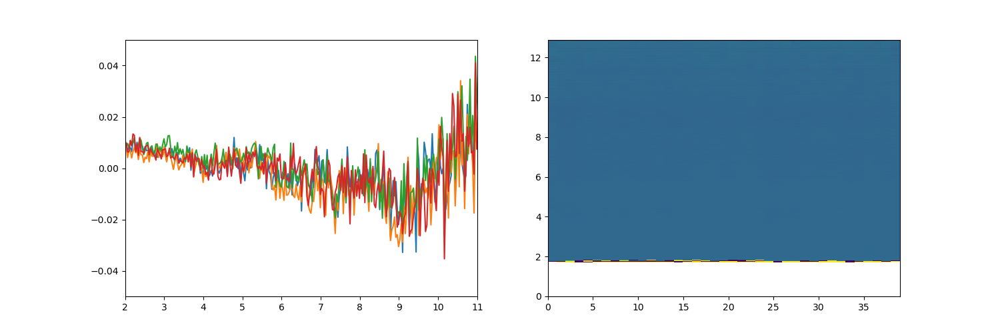

/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:10: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.


<IPython.core.display.Javascript object>


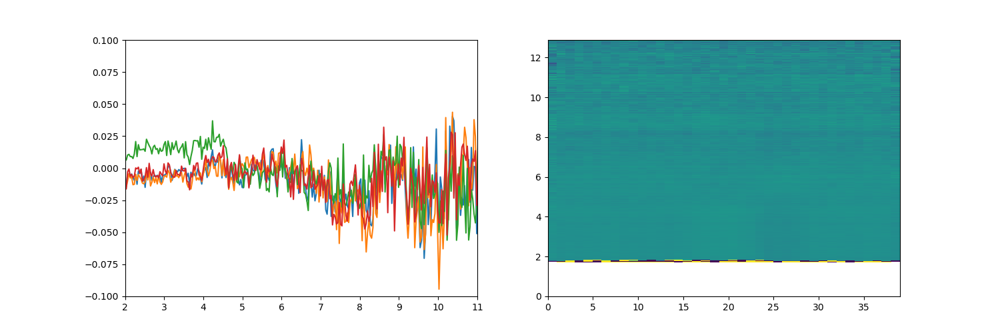

/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:18: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.


<IPython.core.display.Javascript object>


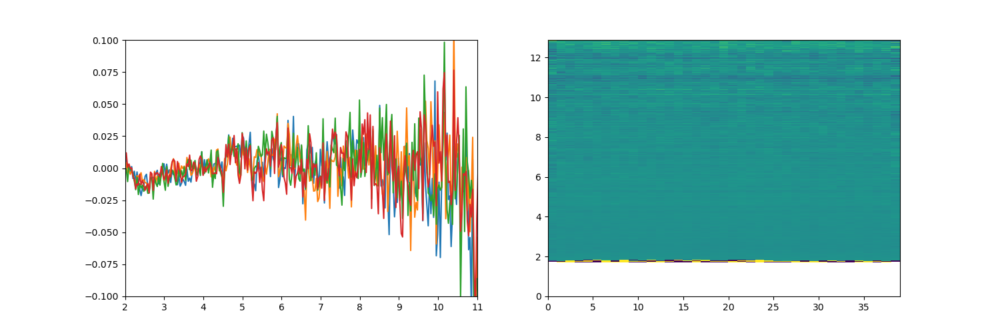

/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:25: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.


In [57]:
print(merged_fits.shape)
pinds = [5,10,20,32]
X,Y = np.meshgrid(np.arange(merged_fits.shape[0]), q)
fig, ax = plt.subplots(1,2,figsize=(15, 5))
for i in pinds:
    ax[0].plot(q, merged_fits[i,:,0]/atm_scattering)
ax[0].set_ylim([-0.05, 0.05])
ax[0].set_xlim([2,11])
time.sleep(0.1)
ax[1].pcolormesh(X, Y, np.transpose(merged_fits[:,:,0]/atm_scattering), vmin=-1, vmax=2)
time.sleep(0.1)
fig, ax = plt.subplots(1,2,figsize=(15, 5))
for i in pinds:
    ax[0].plot(q, merged_fits[i,:,1]/atm_scattering)
ax[0].set_ylim([-0.1, 0.1])
ax[0].set_xlim([2,11])
time.sleep(0.1)
plt.pcolormesh(X,Y,np.transpose(merged_fits[:,:,1]/atm_scattering), vmin=-0.5, vmax=0.5)
fig, ax = plt.subplots(1,2,figsize=(15, 5))
for i in pinds:
    ax[0].plot(q, merged_fits[i,:,2]/atm_scattering)
ax[0].set_ylim([-0.1, 0.1])
ax[0].set_xlim([2,11])
time.sleep(0.1)
plt.pcolormesh(X,Y,np.transpose(merged_fits[:,:,2]/atm_scattering), vmin=-0.5, vmax=0.5)

(40, 375, 6)


<IPython.core.display.Javascript object>


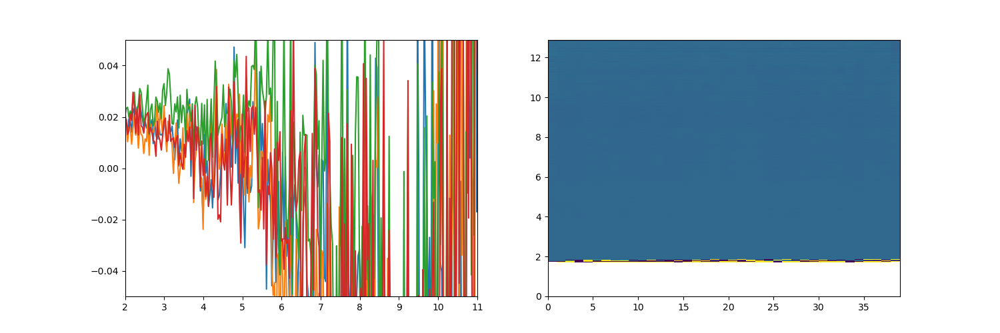

/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:10: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.


<IPython.core.display.Javascript object>


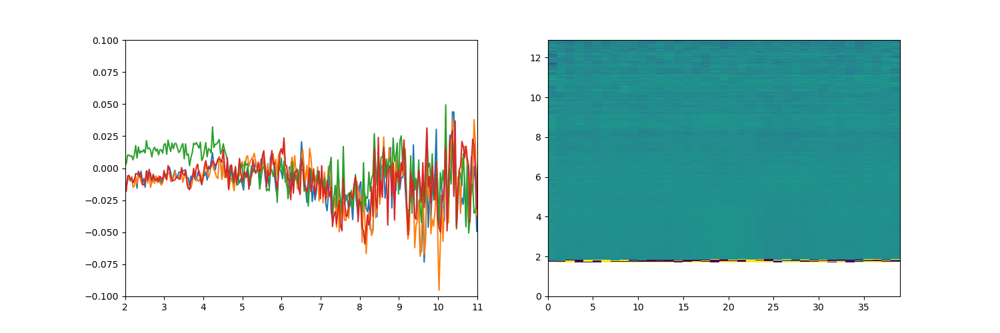

/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:18: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.


<IPython.core.display.Javascript object>


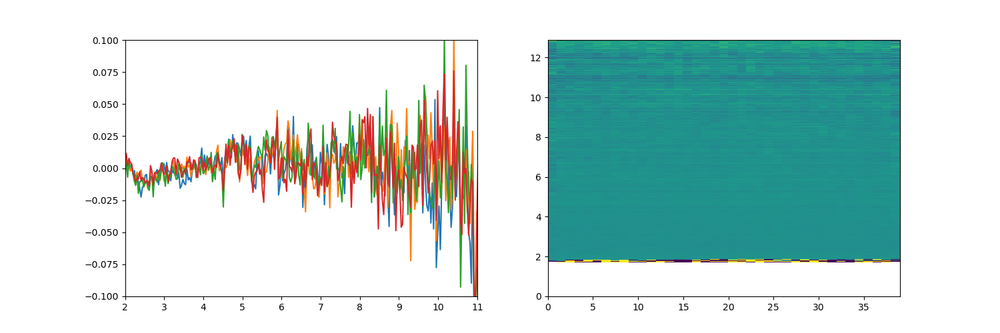

/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:25: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.


In [115]:
print(merged_fits.shape)
pinds = [5,10,20,32]
X,Y = np.meshgrid(np.arange(merged_fits.shape[0]), q)
fig, ax = plt.subplots(1,2,figsize=(15, 5))
for i in pinds:
    ax[0].plot(q, merged_fits[i,:,0]*q/atm_scattering)
ax[0].set_ylim([-0.05, 0.05])
ax[0].set_xlim([2,11])
time.sleep(0.1)
ax[1].pcolormesh(X, Y, np.transpose(merged_fits[:,:,0]/atm_scattering), vmin=-1, vmax=2)
time.sleep(0.1)
fig, ax = plt.subplots(1,2,figsize=(15, 5))
for i in pinds:
    ax[0].plot(q, merged_fits[i,:,1]/atm_scattering)
ax[0].set_ylim([-0.1, 0.1])
ax[0].set_xlim([2,11])
time.sleep(0.1)
plt.pcolormesh(X,Y,np.transpose(merged_fits[:,:,1]/atm_scattering), vmin=-0.5, vmax=0.5)
fig, ax = plt.subplots(1,2,figsize=(15, 5))
for i in pinds:
    ax[0].plot(q, merged_fits[i,:,2]/atm_scattering)
ax[0].set_ylim([-0.1, 0.1])
ax[0].set_xlim([2,11])
time.sleep(0.1)
plt.pcolormesh(X,Y,np.transpose(merged_fits[:,:,2]/atm_scattering), vmin=-0.5, vmax=0.5)

/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:4: RuntimeWarning: Mean of empty slice


<IPython.core.display.Javascript object>


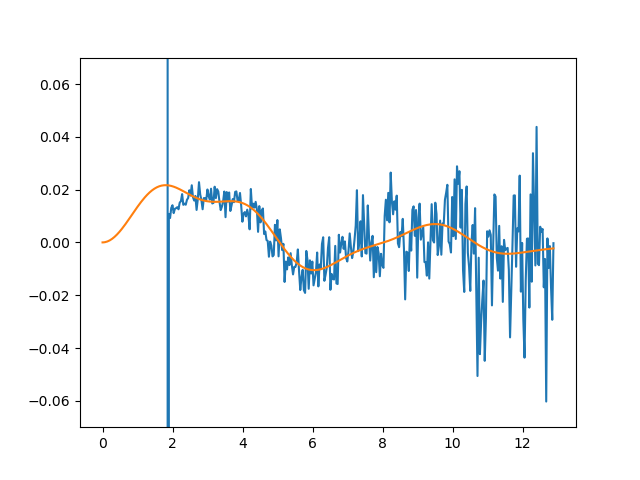

/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:11: RuntimeWarning: Mean of empty slice


<IPython.core.display.Javascript object>


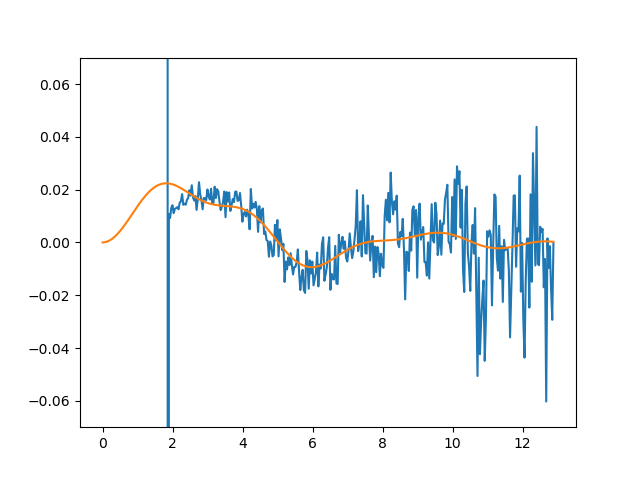

(-0.07, 0.07)

In [103]:
from scipy.special import spherical_jn
sim = spherical_jn(2,q*1.12) + spherical_jn(2, 1.18*q) + spherical_jn(2,2.4*q)
final_fits_ = merged_fits*np.expand_dims(1./atm_scattering, -1)
final_fits_ -= np.expand_dims(np.nanmean(final_fits_[3:-2], 0), 0)
plt.figure()
plt.plot(q,final_fits_[20,:,1]-0.0035)
plt.plot(q, sim*0.033)
plt.ylim([-0.07, 0.07])
sim = spherical_jn(2,q*1.07) + spherical_jn(2, 1.3*q) + spherical_jn(2,2.37*q)
final_fits_ = merged_fits*np.expand_dims(1./atm_scattering, -1)
final_fits_ -= np.expand_dims(np.nanmean(final_fits_[3:-2], 0), 0)
plt.figure()
plt.plot(q,final_fits_[20,:,1]-0.0035)
plt.plot(q, sim*0.033)
plt.ylim([-0.07, 0.07])

## Fitting the single merged image

In [9]:
merged_centers = np.array([[merged_images.shape[-2]//2, merged_images.shape[-1]//2]]*merged_images.shape[0])

merged_image_fits, merged_image_fit_covs = fit_legendres_images(merged_images, merged_centers, np.array([0,2,4,6,8,10]), rad_inds, 
        params.NradAzmBins, image_counts=merged_images_count, image_stds=merged_images_std, rotate=1.62, rad_range=[50,70])


Fitting radius 50


/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:171: RuntimeWarning: invalid value encountered in true_divide
/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:172: RuntimeWarning: invalid value encountered in true_divide


[ 0.03425113  0.03086827  0.0334024   0.03206834  0.04110527  0.03767339
  0.04731749  0.04459177  0.04858438  0.04273994  0.04383057  0.0442829
  0.0519907   0.05183707  0.05990899  0.06156982  0.04643391  0.06288755
  0.04843331  0.05558308  0.07750616  0.0679067   0.05207744  0.05836348
  0.06434991  0.0535034   0.04344408  0.06219347  0.05801742  0.05967251
  0.0724467   0.05117845  0.0440977   0.07566575  0.06957254  0.06276184
  0.07435481  0.05982197  0.0388021   0.06440773  0.05797523  0.06966543
  0.05488613  0.07344199  0.07585539  0.07162304  0.05233734  0.05679196
  0.05917812  0.07456992  0.08911653  0.07291455  0.08380864  0.08230793
  0.09463286  0.07823093  0.05407639  0.04794747  0.07094285  0.0540661
  0.06478733  0.06481429  0.02423114  0.12009288  0.08475479  0.09213917
  0.06313341  0.08313343  0.05722824  0.03469685  0.08339127  0.07095653
  0.07509331  0.06081416  0.0422294   0.04220468  0.00481587  0.01252721
  0.0145011   0.03016924  0.01185992  0.01001014  0.0

<IPython.core.display.Javascript object>


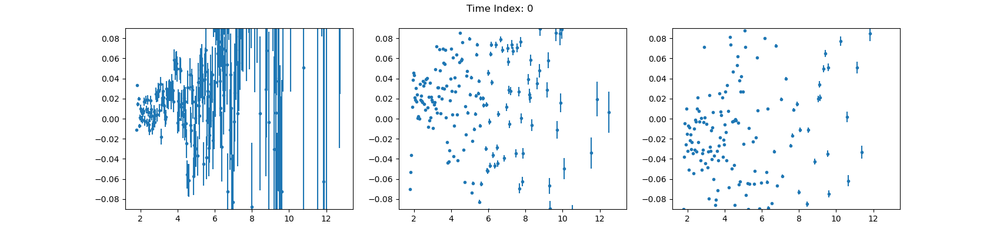

(375,) (375, 6)


<IPython.core.display.Javascript object>


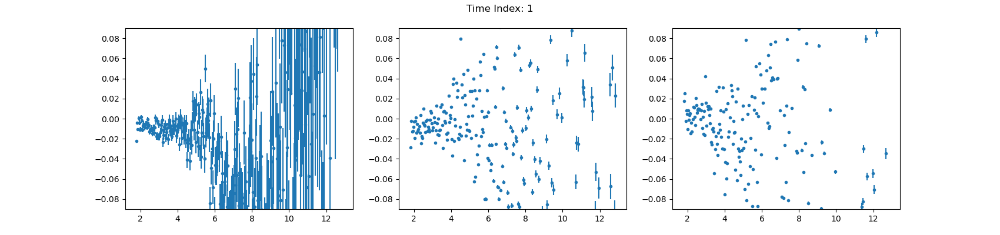

(375,) (375, 6)


<IPython.core.display.Javascript object>


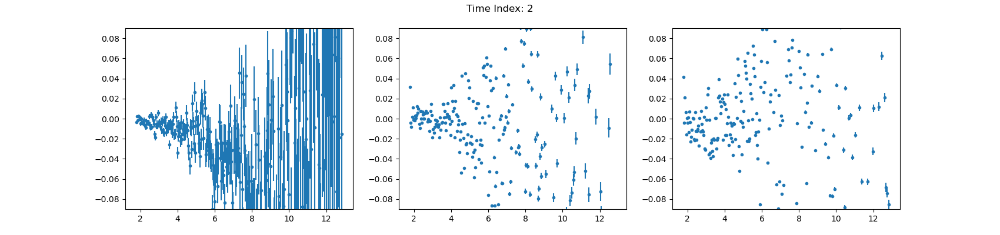

(375,) (375, 6)


<IPython.core.display.Javascript object>


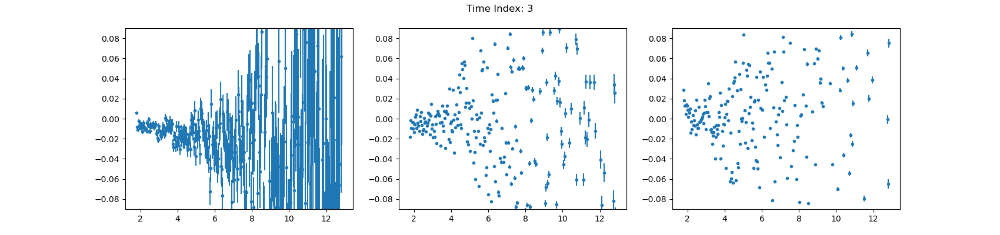

(375,) (375, 6)


<IPython.core.display.Javascript object>


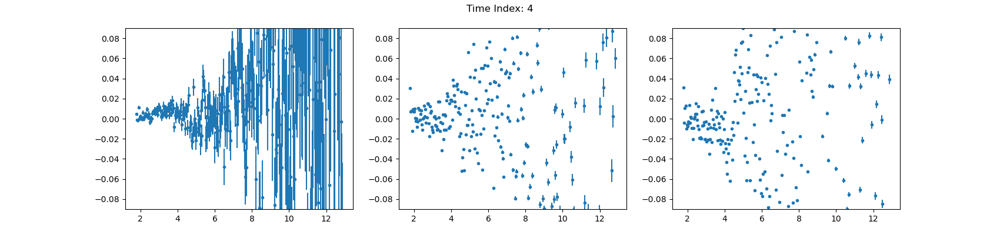

(375,) (375, 6)


<IPython.core.display.Javascript object>


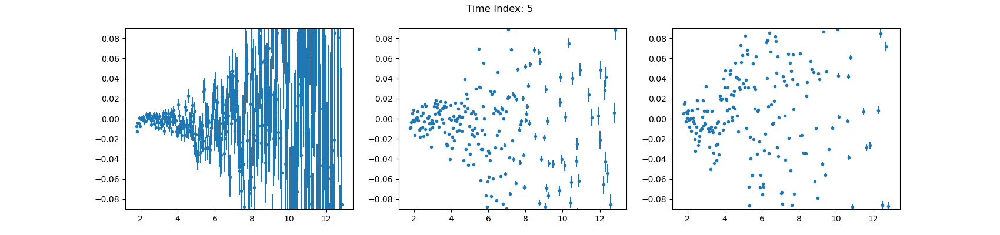

(375,) (375, 6)


<IPython.core.display.Javascript object>


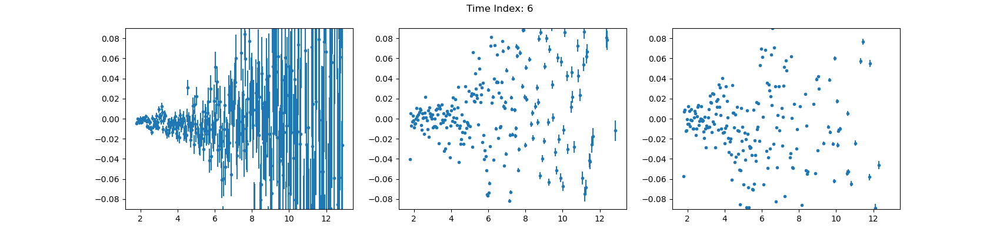

(375,) (375, 6)


<IPython.core.display.Javascript object>


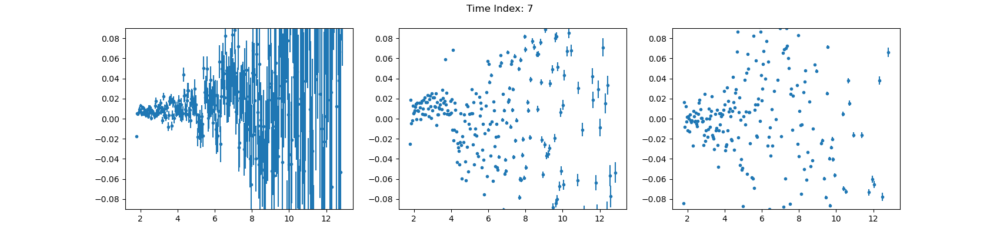

(375,) (375, 6)


<IPython.core.display.Javascript object>


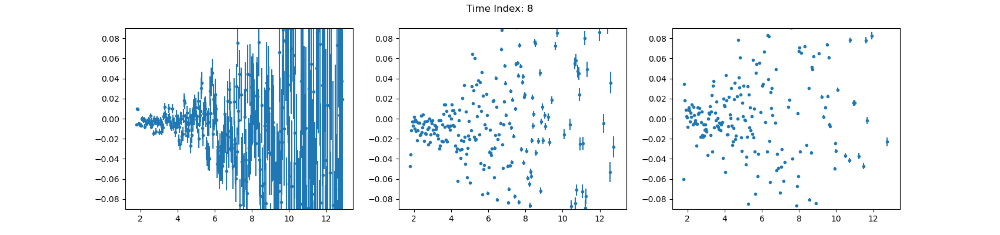

(375,) (375, 6)


<IPython.core.display.Javascript object>


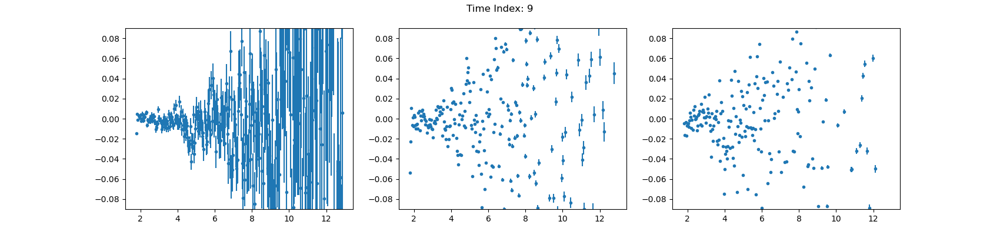

(375,) (375, 6)


<IPython.core.display.Javascript object>


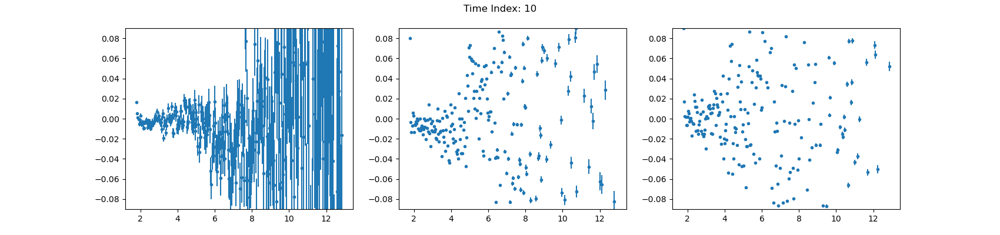

(375,) (375, 6)


<IPython.core.display.Javascript object>


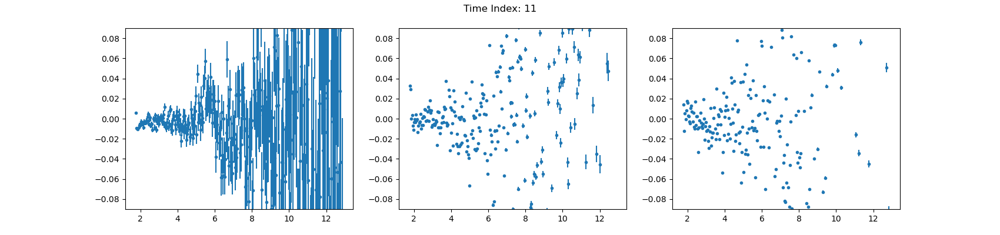

(375,) (375, 6)


<IPython.core.display.Javascript object>


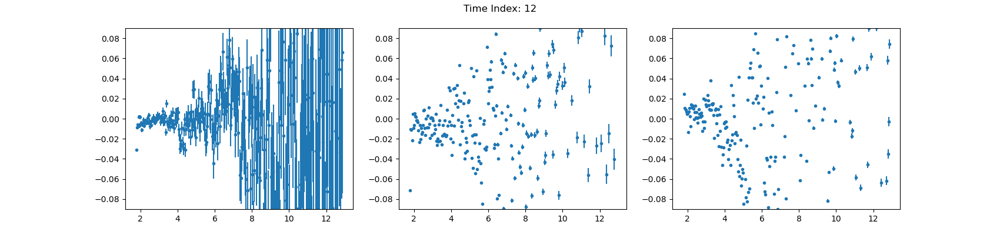

(375,) (375, 6)


<IPython.core.display.Javascript object>


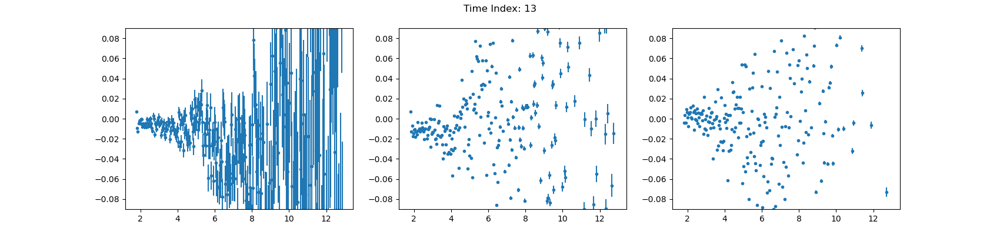

(375,) (375, 6)


<IPython.core.display.Javascript object>


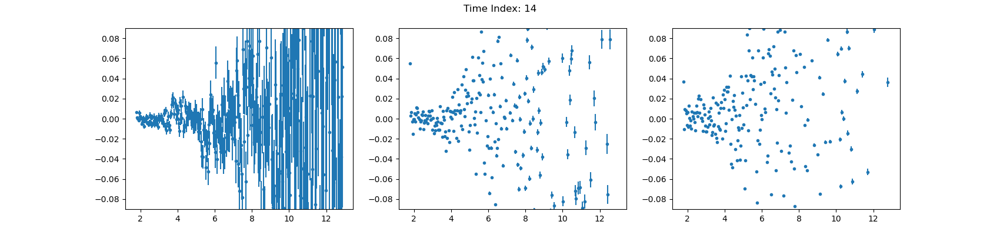

(375,) (375, 6)


<IPython.core.display.Javascript object>


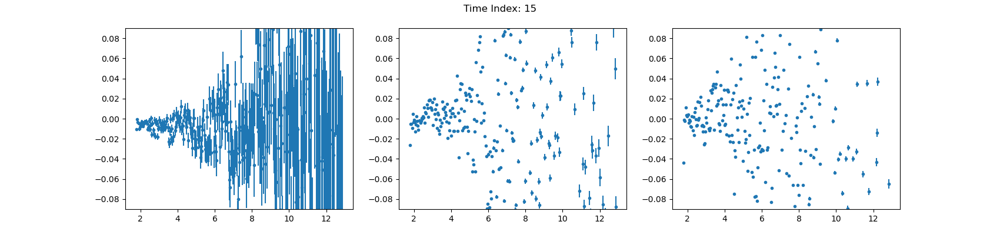

(375,) (375, 6)


<IPython.core.display.Javascript object>


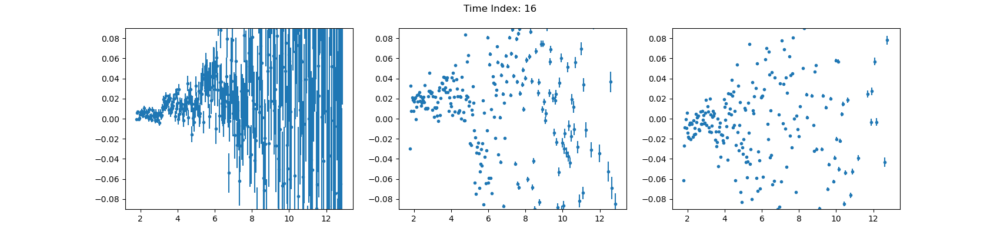

(375,) (375, 6)


<IPython.core.display.Javascript object>


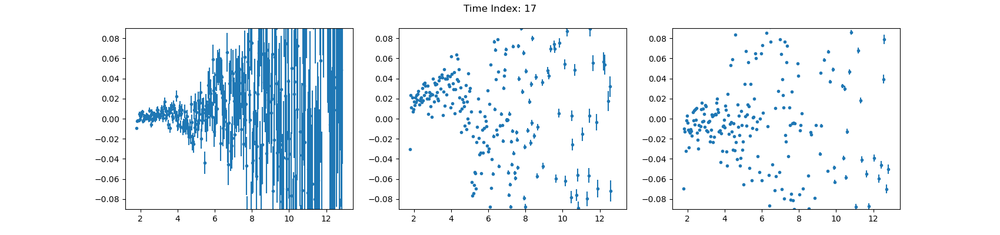

(375,) (375, 6)


<IPython.core.display.Javascript object>


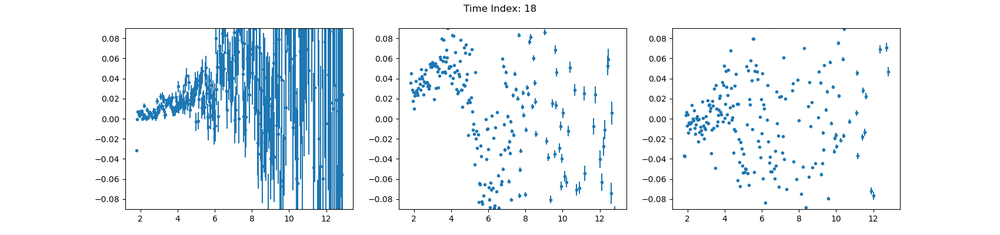

(375,) (375, 6)


<IPython.core.display.Javascript object>


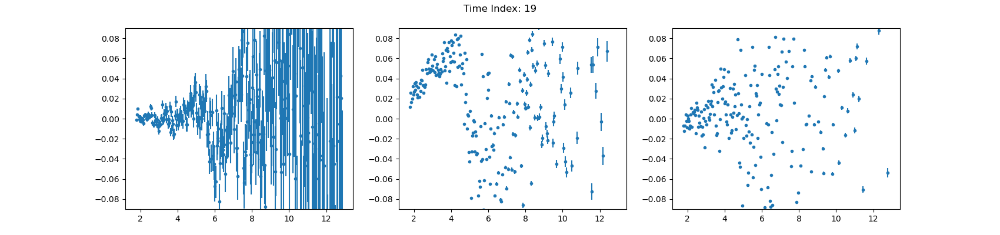

(375,) (375, 6)


<IPython.core.display.Javascript object>


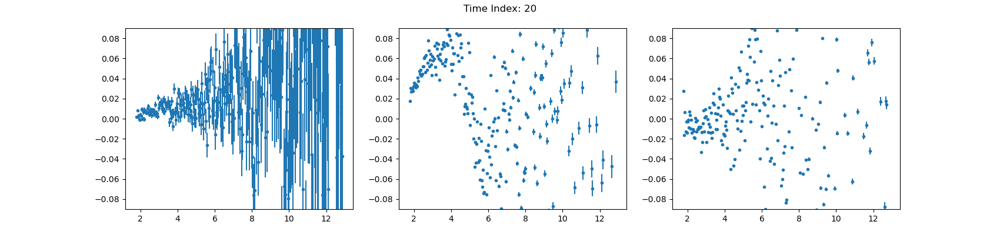

(375,) (375, 6)


<IPython.core.display.Javascript object>


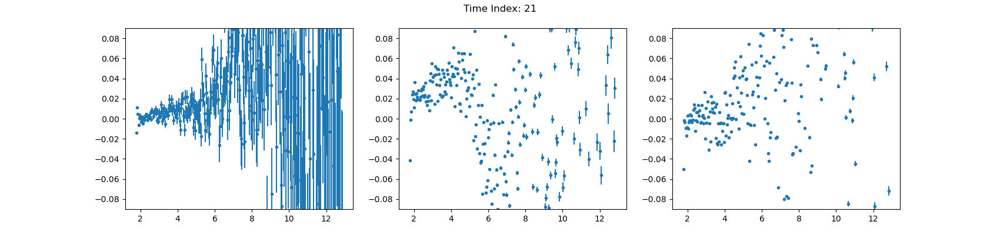

(375,) (375, 6)


<IPython.core.display.Javascript object>


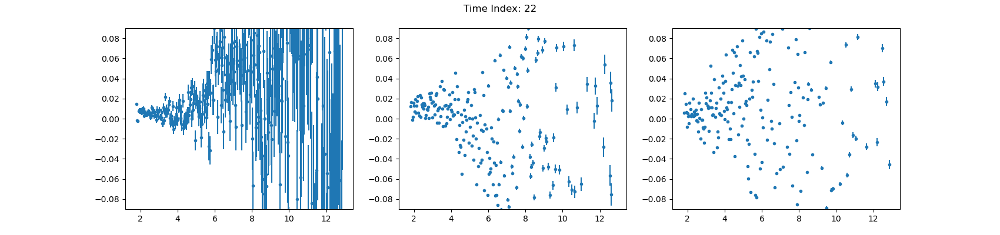

(375,) (375, 6)


<IPython.core.display.Javascript object>


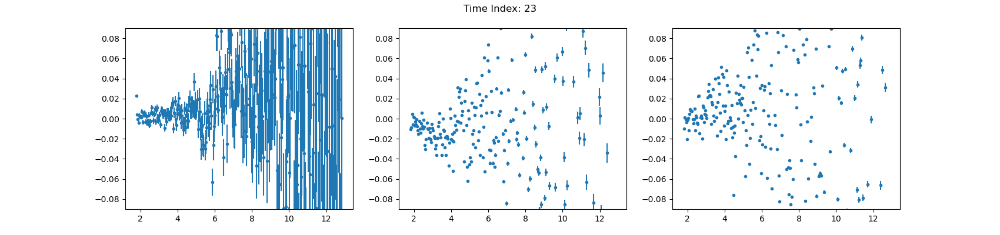

(375,) (375, 6)


<IPython.core.display.Javascript object>


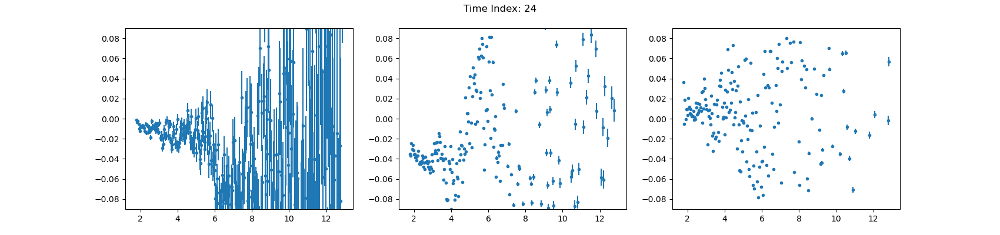

(375,) (375, 6)


<IPython.core.display.Javascript object>


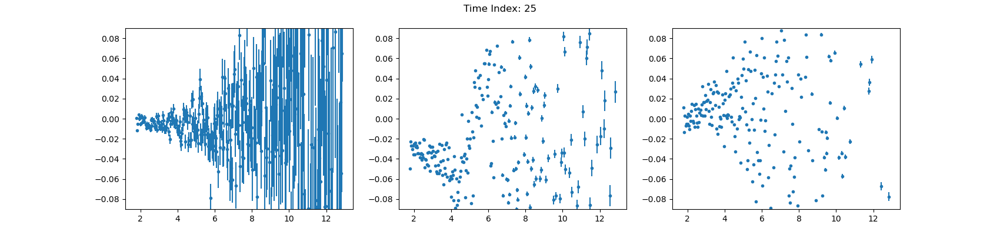

(375,) (375, 6)


<IPython.core.display.Javascript object>


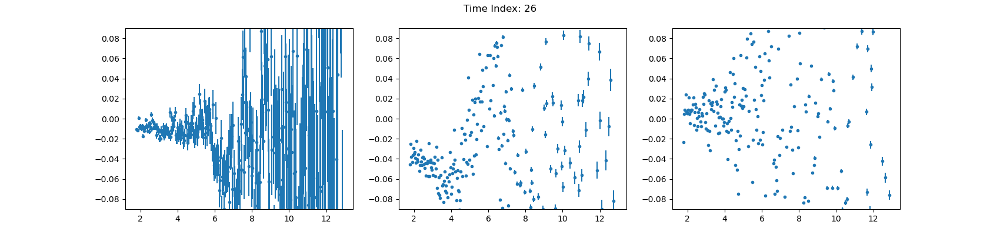

(375,) (375, 6)


<IPython.core.display.Javascript object>


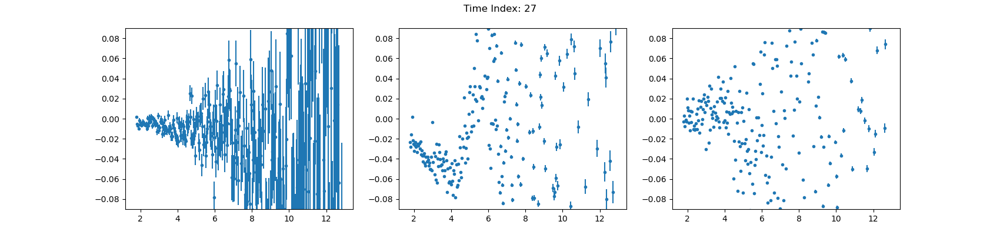

(375,) (375, 6)


<IPython.core.display.Javascript object>


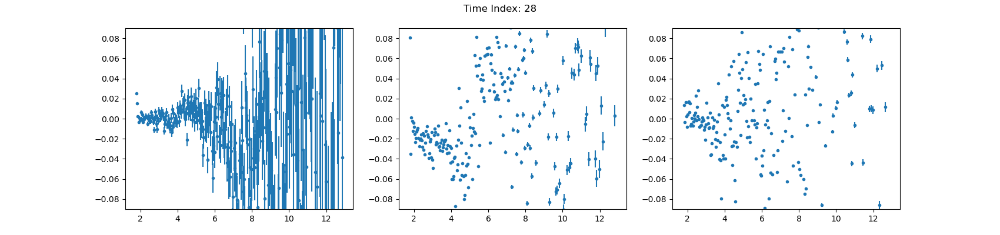

(375,) (375, 6)


<IPython.core.display.Javascript object>


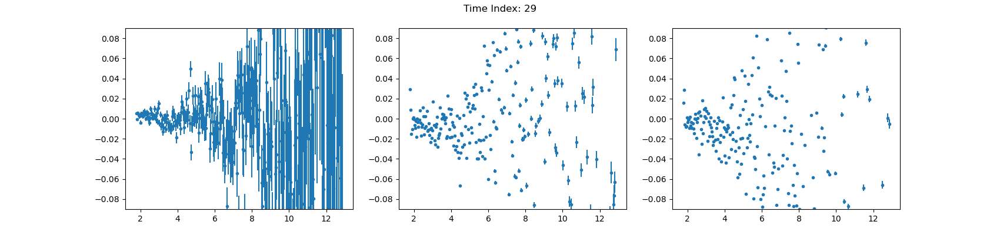

(375,) (375, 6)


<IPython.core.display.Javascript object>


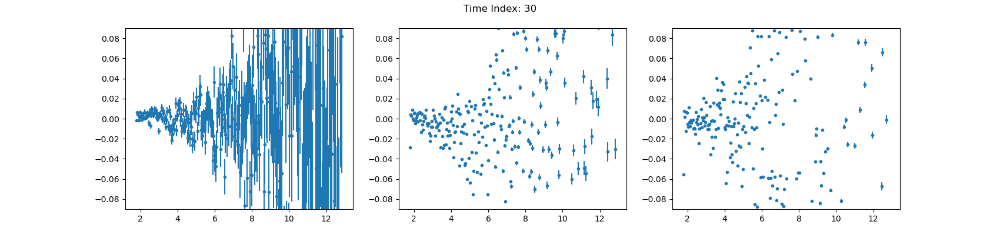

(375,) (375, 6)


<IPython.core.display.Javascript object>


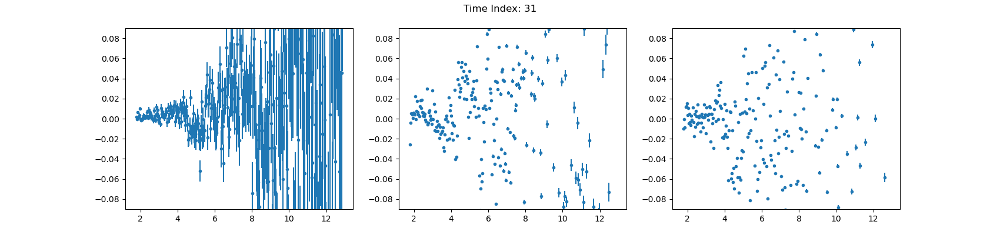

(375,) (375, 6)


<IPython.core.display.Javascript object>


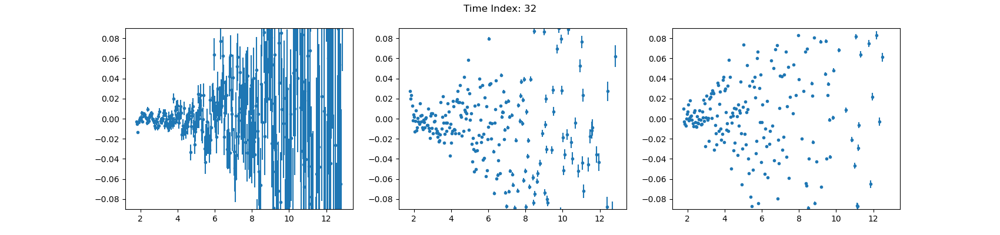

(375,) (375, 6)


<IPython.core.display.Javascript object>


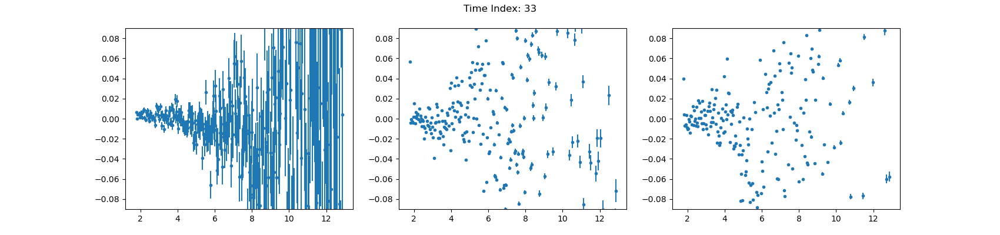

(375,) (375, 6)


<IPython.core.display.Javascript object>


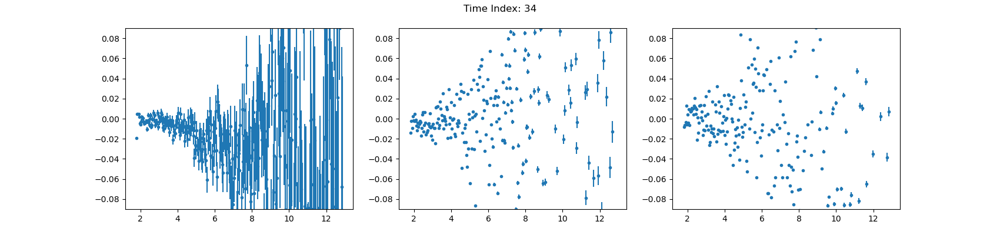

(375,) (375, 6)


<IPython.core.display.Javascript object>


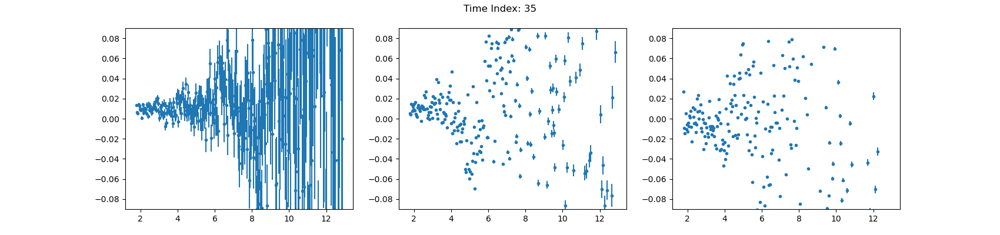

(375,) (375, 6)


<IPython.core.display.Javascript object>


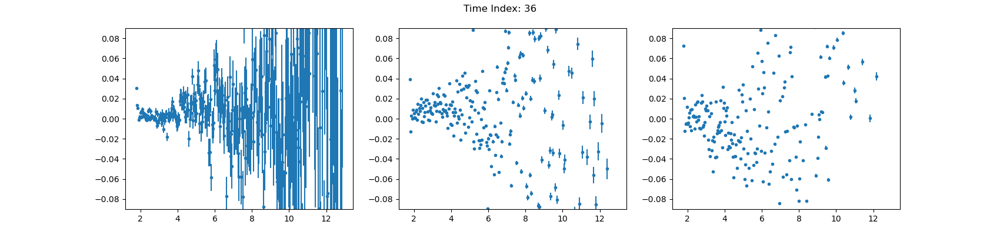

(375,) (375, 6)


<IPython.core.display.Javascript object>


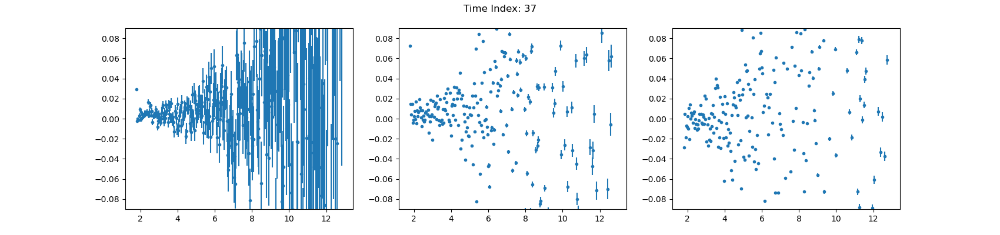

(375,) (375, 6)


<IPython.core.display.Javascript object>


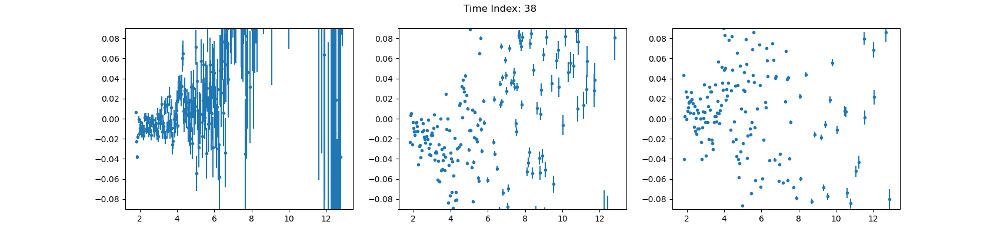

(375,) (375, 6)


<IPython.core.display.Javascript object>


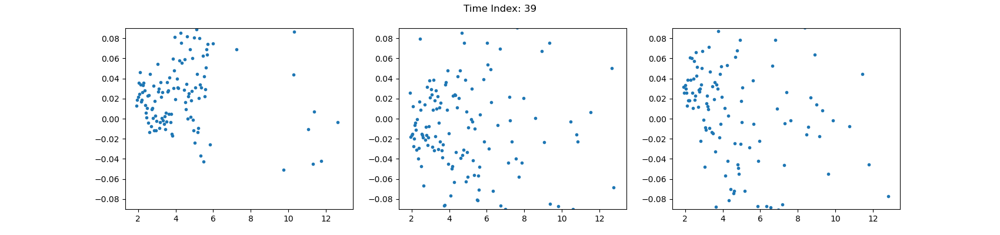

(375,) (375, 6)


In [101]:
print(final_fits[20,60:150,1])
print(final_stds[20,60:150,1,1])

for i in range(final_fits.shape[0]):
    fig, ax = plt.subplots(1, 3, figsize=(17,4))
    fig.suptitle("Time Index: {}".format(i))
    print(final_fits[i,:,0].shape, merged_image_fit_covs[i,:,0].shape)
    ax[0].errorbar(q,final_fits[i,:,0], yerr=final_stds[i,:,0,0], fmt='.')
    ax[0].set_ylim([-0.09, 0.09])
    ax[1].errorbar(q,final_fits[i,:,1], yerr=final_stds[i,:,1,1], fmt='.')
    ax[1].set_ylim([-0.09, 0.09])
    ax[2].errorbar(q,final_fits[i,:,2], yerr=final_stds[i,:,2,2], fmt='.')
    ax[2].set_ylim([-0.09, 0.09])
    

In [55]:
# Saving
save_image_fits = []
maxSize = max([image_fits[i].shape[0] for i in range(len(image_fits))])
for i in range(len(image_fits)):
    shape = image_fits[i].shape
    if shape[0] < maxSize:
        save_image_fits.append(np.concatenate([image_fits[i], np.ones((maxSize-shape[0], shape[1], shape[2]))*np.nan]))
    else:
        save_image_fits.append(image_fits[i])
save_image_fits = np.array(save_image_fits)

fName = os.path.join(params.mergeScansOutputDir, 'legendre_coeffs.h5')
with h5py.File(fName, 'w') as file:
    file.create_dataset('image_coeffs', data=save_image_fits)
    file.create_dataset('coefficients', data=np.transpose(merged_fits, (2,1,0)))
    file.create_dataset('std', data=np.transpose(merged_fits_std, (2,1,0)))
    file.create_dataset('q', data=q)

In [34]:
# Retriving
fName = os.path.join(params.mergeScansOutputDir, 'legendre_coeffs.h5')
with h5py.File(fName, 'r') as file:
    #q = file['q'][:]
    merged_fits = np.transpose(file['coefficients'][:], (2,1,0))
    merged_fits_std = np.transpose(file['std'][:], (2,1,0))

# Find Polarization Angle

In [84]:
asr_fits = []
rotations = []
for rot in np.linspace(np.pi/2-0.7, np.pi/2+0.3, 150):
    fits, _ = fit_legendres_images(merged_images, merged_centers, np.array([0,2]), rad_inds,
            params.NradAzmBins, rotate=rot, image_counts=merged_images_count, rad_range=[75,275])
    final_fits = fits*np.expand_dims(1./atm_scattering, -1)[75:275]
    final_fits -= np.expand_dims(np.nanmean(final_fits[3:-2], 0), 0)
    rotations.append(rot)

    asr_fits.append(final_fits)

asr_fits = np.array(asr_fits)
asr_fits /= np.expand_dims(np.expand_dims(q[75:275], -1), 0)

Fitting radius 75


/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:178: RuntimeWarning: invalid value encountered in true_divide
/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:179: RuntimeWarning: invalid value encountered in true_divide


Fitting radius 100
Fitting radius 125
Fitting radius 150
Fitting radius 175
Fitting radius 200
Fitting radius 225
Fitting radius 250
Fitting radius 75
Fitting radius 100
Fitting radius 125
Fitting radius 150
Fitting radius 175
Fitting radius 200
Fitting radius 225
Fitting radius 250
Fitting radius 75
Fitting radius 100
Fitting radius 125
Fitting radius 150
Fitting radius 175
Fitting radius 200
Fitting radius 225
Fitting radius 250
Fitting radius 75
Fitting radius 100
Fitting radius 125
Fitting radius 150
Fitting radius 175
Fitting radius 200
Fitting radius 225
Fitting radius 250
Fitting radius 75
Fitting radius 100
Fitting radius 125
Fitting radius 150
Fitting radius 175
Fitting radius 200
Fitting radius 225
Fitting radius 250
Fitting radius 75
Fitting radius 100
Fitting radius 125
Fitting radius 150
Fitting radius 175
Fitting radius 200
Fitting radius 225
Fitting radius 250
Fitting radius 75
Fitting radius 100
Fitting radius 125
Fitting radius 150
Fitting radius 175
Fitting radius 200

Fitting radius 175
Fitting radius 200
Fitting radius 225
Fitting radius 250
Fitting radius 75
Fitting radius 100
Fitting radius 125
Fitting radius 150
Fitting radius 175
Fitting radius 200
Fitting radius 225
Fitting radius 250
Fitting radius 75
Fitting radius 100
Fitting radius 125
Fitting radius 150
Fitting radius 175
Fitting radius 200
Fitting radius 225
Fitting radius 250
Fitting radius 75
Fitting radius 100
Fitting radius 125
Fitting radius 150
Fitting radius 175
Fitting radius 200
Fitting radius 225
Fitting radius 250
Fitting radius 75
Fitting radius 100
Fitting radius 125
Fitting radius 150
Fitting radius 175
Fitting radius 200
Fitting radius 225
Fitting radius 250
Fitting radius 75
Fitting radius 100
Fitting radius 125
Fitting radius 150
Fitting radius 175
Fitting radius 200
Fitting radius 225
Fitting radius 250
Fitting radius 75
Fitting radius 100
Fitting radius 125
Fitting radius 150
Fitting radius 175
Fitting radius 200
Fitting radius 225
Fitting radius 250
Fitting radius 75


Fitting radius 250
Fitting radius 75
Fitting radius 100
Fitting radius 125
Fitting radius 150
Fitting radius 175
Fitting radius 200
Fitting radius 225
Fitting radius 250
Fitting radius 75
Fitting radius 100
Fitting radius 125
Fitting radius 150
Fitting radius 175
Fitting radius 200
Fitting radius 225
Fitting radius 250
Fitting radius 75
Fitting radius 100
Fitting radius 125
Fitting radius 150
Fitting radius 175
Fitting radius 200
Fitting radius 225
Fitting radius 250
Fitting radius 75
Fitting radius 100
Fitting radius 125
Fitting radius 150
Fitting radius 175
Fitting radius 200
Fitting radius 225
Fitting radius 250
Fitting radius 75
Fitting radius 100
Fitting radius 125
Fitting radius 150
Fitting radius 175
Fitting radius 200
Fitting radius 225
Fitting radius 250
Fitting radius 75
Fitting radius 100
Fitting radius 125
Fitting radius 150
Fitting radius 175
Fitting radius 200
Fitting radius 225
Fitting radius 250
Fitting radius 75
Fitting radius 100
Fitting radius 125
Fitting radius 150


In [90]:
fName = os.path.join(params.mergeScansOutputDir, 'legendre_quantization_axis.h5')
with h5py.File(fName, 'w') as file:
    file.create_dataset('fit_values', data=asr_fits)
    file.create_dataset('rotations',  data=rotations)

(150, 40, 200, 2)
(150,)


<IPython.core.display.Javascript object>


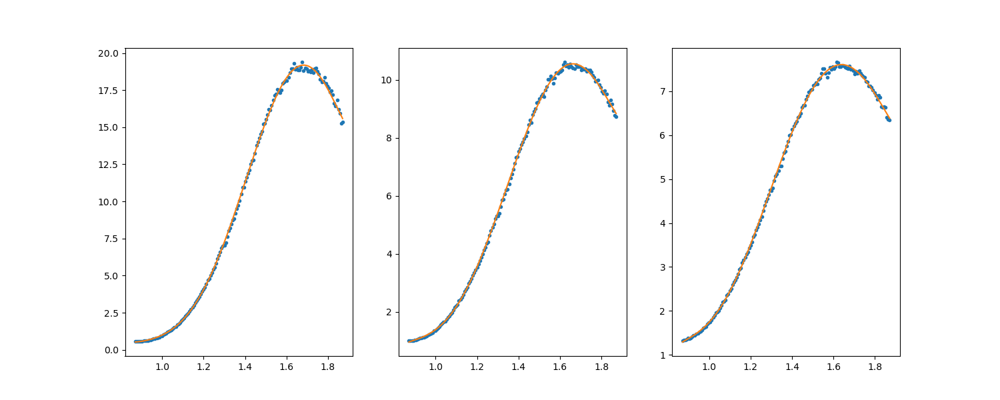

1.6828768637076483 1.6627426355197288 1.6358969979358362


In [96]:
st, et = 15, 30
rotations = np.array(rotations)
sum_r1_l0 = np.sum(np.sum(asr_fits[:,st:et,:50,0]**2, axis=1), axis=1)
sum_r1_l2 = np.sum(np.sum(asr_fits[:,st:et,:50,1]**2, axis=1), axis=1)
sum_r2_l0 = np.sum(np.sum(asr_fits[:,st:et,:125,0]**2, axis=1), axis=1)
sum_r2_l2 = np.sum(np.sum(asr_fits[:,st:et,:125,1]**2, axis=1), axis=1)
sum_r3_l0 = np.sum(np.sum(asr_fits[:,st:et,:,0]**2, axis=1), axis=1)
sum_r3_l2 = np.sum(np.sum(asr_fits[:,st:et,:,1]**2, axis=1), axis=1)

mn = np.mean(rotations)
polys = []
for i in range(7):
    polys.append((rotations-mn)**i)
polys = np.array(polys)
coeffs1 = np.matmul(
    np.linalg.inv(np.matmul(polys, np.transpose(polys))),
    np.matmul(polys, sum_r1_l2/sum_r1_l0))
coeffs2 = np.matmul(
    np.linalg.inv(np.matmul(polys, np.transpose(polys))),
    np.matmul(polys, sum_r2_l2/sum_r2_l0))
coeffs3 = np.matmul(
    np.linalg.inv(np.matmul(polys, np.transpose(polys))),
    np.matmul(polys, sum_r3_l2/sum_r3_l0))
fig, ax = plt.subplots(1,3,figsize=(15,6))
ax[0].plot(rotations, sum_r1_l2/sum_r1_l0, '.')
ax[1].plot(rotations, sum_r2_l2/sum_r2_l0, '.')
ax[2].plot(rotations, sum_r3_l2/sum_r3_l0, '.')
ax[0].plot(rotations, np.matmul(coeffs1,polys))
ax[1].plot(rotations, np.matmul(coeffs2,polys))
ax[2].plot(rotations, np.matmul(coeffs3,polys))

print(rotations[np.argmax(np.matmul(coeffs1,polys))],
      rotations[np.argmax(np.matmul(coeffs2,polys))],
      rotations[np.argmax(np.matmul(coeffs3,polys))],)


# Aligning Scans (Only Need to do Once)

In [67]:
def normal_eqn(X, Y, W):
    overlap = np.einsum('ai,bi,ci->bac', X, W, X, optimize='greedy')
    if np.linalg.det(overlap) == 0:
        print("Overlap matrix is singular")
        return np.ones((Y.shape[0], X.shape[0]))*np.nan
    
    denom = np.linalg.inv(overlap)
    numer = np.einsum('ai,bi,bi->ba', X, W, Y, optimize='greedy')
    return np.einsum('abi,ai->ab', denom, numer, optimize='greedy')



def fit_legendres_images(images, centers, lg_inds, rad_inds, maxPixel, rotate=0,
        image_weights=None, image_counts=None, weights_are_std=False,
        rad_range=None):
    
    if image_counts is None:
        image_counts = np.ones_like(images)
        image_counts[np.isnan(images)] = 0
    
    if weights_are_std and (image_weights is None):
        print("If weights_are_std = True then you must specify image_weights")
        return None
        

    with_scans = len(images.shape) >= 4

    all_fits = []
    for rad in range(maxPixel):
        if rad_range is not None:
            if rad < rad_range[0] or rad >= rad_range[1]:
                continue
        #if rad % 25 == 0:
        #  print("Fitting radius {}".format(rad))

        pixels, nans, angles = [], [], []
        all_angles = np.arctan2(rad_inds[rad][1].astype(float), rad_inds[rad][0].astype(float))
        all_angles[all_angles<0] += 2*np.pi
        all_angles = np.mod(all_angles + rotate, 2*np.pi)
        all_angles[all_angles > np.pi] -= 2*np.pi
        if np.sum(np.mod(lg_inds, 2)) == 0:
            all_angles[np.abs(all_angles) > np.pi/2.] -= np.pi*np.sign(all_angles[np.abs(all_angles) > np.pi/2.])
        angles = np.sort(np.unique(np.abs(all_angles)))
        
        if len(angles) == len(all_angles):
            do_merge = False
        else:
            do_merge = True
            mi_rows, mi_cols, mi_data = [], [], []
            pr,pc,pv = [],[],[]
            for ia,ang in enumerate(angles):
                inds = np.where(np.abs(all_angles) == ang)[0]
                mi_rows.append(np.ones_like(inds)*ia)
                mi_cols.append(inds)
            mi_rows, mi_cols = np.concatenate(mi_rows), np.concatenate(mi_cols)

            merge_indices = csr_matrix((np.ones_like(mi_rows), (mi_rows, mi_cols)),
                    shape=(len(angles), len(all_angles)))


        # Sort angles and get the midpoint
        dth = angles[1:] - angles[:-1]
        angles = (angles[1:] + angles[:-1])/2.
        
        # Calculate legendres
        lgndrs = []
        for lg in lg_inds:
            lgndrs.append(legendre(lg)(np.cos(angles)))
        lgndrs = np.array(lgndrs)
        
    
        # Begin fitting
        img_fits = []
        if with_scans:
            Nimages = images.shape[1]
        else:
            Nimages = images.shape[0]
        for im in np.arange(Nimages):
            #if im < 17:
            #    continue
            
            if with_scans:
                scn_inds, row_inds, col_inds = [], [], []
                for isc in range(images.shape[0]):
                    scn_inds.append(np.ones(rad_inds[rad][0].shape[0], dtype=int)*isc)
                    row_inds.append(rad_inds[rad][0]+centers[isc,im,0])
                    col_inds.append(rad_inds[rad][1]+centers[isc,im,1])
                    
                scn_inds = np.concatenate(scn_inds)
                row_inds = np.concatenate(row_inds)
                col_inds = np.concatenate(col_inds)
                img_pixels = np.reshape(copy(images[scn_inds,im,row_inds,col_inds]), (images.shape[0], -1))
                img_counts = np.reshape(copy(image_counts[scn_inds,im,row_inds,col_inds]), (images.shape[0], -1))
                if image_weights is not None:
                    img_weights = np.reshape(copy(image_weights[scn_inds,im,row_inds,col_inds]), (images.shape[0], -1))
                
            else:
                row_inds = rad_inds[rad][0]+centers[im,0]
                col_inds = rad_inds[rad][1]+centers[im,1]
                img_pixels = np.reshape(copy(images[im,row_inds,col_inds]), (1, -1))
                img_counts = np.reshape(copy(image_counts[im,row_inds,col_inds]), (1, -1))
                if image_weights is not None:
                    img_weights = np.reshape(copy(image_weights[im,row_inds,col_inds]), (1, -1))
            
            
            img_pix_ = copy(img_pixels)
            img_cnt_ = copy(img_counts)
            #print(merge_indices.shape)
            #print(merge_indices.toarray()[0,:])
            #print(img_pixels[0,merge_indices.toarray()[0,:].astype(bool)])
            #print("img_pixels")
            #print(img_pixels)
            img_pixW = img_pixels*img_counts
            img_pixW[np.isnan(img_pixels)] = 0
            #print(img_pixW[0,merge_indices.toarray()[0,:].astype(bool)])
            #print(img_counts[0,merge_indices.toarray()[0,:].astype(bool)])
            #img_varW = img_counts*(img_stds**2)
            if do_merge: 
                
                #tic = time.time()
                img_pixW = np.transpose(merge_indices.dot(np.transpose(img_pixW)))
                #print(img_pixW.shape, img_pixW[0])
                #img_varW = np.transpose(merge_indices.dot(np.transpose(img_varW)))
                
                
                img_counts = np.transpose(merge_indices.dot(np.transpose(img_counts)))
                #print(time.time() - tic)
                #img_pixels /= img_counts
                #img_stds   = np.sqrt(img_stds/img_counts)
                
                if image_weights is not None:
                    print("Must fill this in, don't forget std option")
                    sys.exit(0)
            
            img_pixels = np.nansum(np.concatenate(
                    [np.expand_dims(img_pixW[:,1:], -1), np.expand_dims(img_pixW[:,:-1], -1)], -1), -1)
            #img_vars = np.nansum(np.concatenate(
            #        [np.expand_dims(img_varW[:,1:], -1), np.expand_dims(img_varW[:,:-1], -1)], -1), -1)
            img_counts = np.nansum(np.concatenate(
                    [np.expand_dims(img_counts[:,1:], -1), np.expand_dims(img_counts[:,:-1], -1)], -1), -1)
            img_pixels /= img_counts
            #print("with dot")
            #print(img_pixels)
            #img_vars   /= img_counts
            #img_vars[np.isnan(img_pixels)] = 0
            
            """
            img_pixels = img_pix_
            img_counts = img_cnt_
            if do_merge: 
                img_pixels[np.isnan(img_pixels)] = 0
                img_pixels = np.expand_dims(img_pixels, 1)
                
                img_pixels = np.array(merge_indices.multiply(img_counts).multiply(img_pixels).sum(-1))
                img_counts = np.expand_dims(img_counts, 1)
                img_counts = np.array(merge_indices.multiply(img_counts).sum(-1))
                img_pixels /= img_counts
                if image_weights is not None:
                    print("Must fill this in, don't forget std option")
                    sys.exit(0)
                
            img_pixW = img_pixels*img_counts
            img_pixels = np.nansum(np.concatenate(
                    [np.expand_dims(img_pixW[:,1:], -1), np.expand_dims(img_pixW[:,:-1], -1)], -1), -1)
            img_counts = np.nansum(np.concatenate(
                    [np.expand_dims(img_counts[:,1:], -1), np.expand_dims(img_counts[:,:-1], -1)], -1), -1)
            img_pixels /= img_counts
            print("multiply")
            print(img_pixels)
            sys.exit(0)
            """
            
            
            if image_weights is not None:
                print("Must fill this in and check below")
                sys.exit(0)
                if weights_are_std:
                    img_varW = img_counts*img_std**2
                    img_var = np.nansum(np.concatenate(
                            [np.expand_dims(img_varW[:,1:], -1), np.expand_dims(img_varW[:,:-1], -1)], -1), -1)\
                            /np.nansum(np.concatenate(
                            [np.expand_dims(img_counts[:,1:], -1), np.expand_dims(img_counts[:,:-1], -1)], -1), -1)
                    img_weights = 1./img_var
            else:
                img_weights = np.ones_like(img_counts)
                img_weights[img_counts==0] = 0
            img_weights *= np.sin(angles)*dth
            
            img_weights[np.isnan(img_pixels)] = 0
            img_pixels[np.isnan(img_pixels)] = 0
            empty_scan = np.sum(img_weights.astype(bool), -1) < 2
        
            if np.any(empty_scan):
                fit = np.ones((img_pixels.shape[0], lgndrs.shape[0]))*np.nan
            
                if np.any(np.invert(empty_scan)):
                    img_pixels  = img_pixels[np.invert(empty_scan)]
                    img_weights = img_weights[np.invert(empty_scan)]
                    fit[np.invert(empty_scan)] = normal_eqn(lgndrs, img_pixels, img_weights)
            else:
                fit = normal_eqn(lgndrs, img_pixels, img_weights)
            img_fits.append(np.expand_dims(fit, 1))
        all_fits.append(np.expand_dims(np.concatenate(img_fits, 1), 2))
    
    all_fits = np.concatenate(all_fits, 2)
    if with_scans:
        return all_fits, 4
    else:
        return all_fits[0], 4

In [66]:
sm = csr_matrix((np.array([1,1,1]), (np.array([0,1,1]), np.array([1,1,2]))))
ar = np.reshape(np.arange(12), (4,3))
print(sm.toarray(), ar)
print("mult")
print(sm.multiply(np.expand_dims(ar, 1)).sum(-1))
print("dot")
print(sm.dot(np.transpose(ar)))

fits, _ = fit_legendres_images(merged_images, merged_centers, np.array([0,2]), rad_inds,
            params.NradAzmBins, rotate=np.pi/2., rad_range=[75,150])

[[0 1 0]
 [0 1 1]] [[ 0  1  2]
 [ 3  4  5]
 [ 6  7  8]
 [ 9 10 11]]
mult
[[ 1  3]
 [ 4  9]
 [ 7 15]
 [10 21]]
dot
[[ 1  4  7 10]
 [ 3  9 15 21]]
(185, 456)
[17.78753799         nan]
img_pixels
[17.78753799  0.        ]
[1. 0.]
(1, 185) [  17.78753799   -5.48945227   -5.79695064   -9.03980816    0.
   11.93035704   68.16478964   82.76775327    0.          -16.09566283
  -34.3002091     8.09118036    0.           23.20210776   24.31490032
  -69.30411884   26.71143344   72.07759114    0.           72.71347312
  -24.59812693   67.68862034    0.          -80.6653372   -22.49642386
   99.86641387   -9.83743753    0.           75.23000985    0.
  -52.64162357   50.56331357   89.00067739    0.           17.40665207
   78.9885181    72.22626114    0.            2.8759202  -125.04487161
  -72.58132071   56.94633285  -53.23452082  -31.29202171  -69.40268862
    0.           30.11427138   30.58738822   91.28190045    0.
   88.07922706  -18.17679828   29.01178252   43.73534854    0.
  -31.72787583 

/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:143: RuntimeWarning: invalid value encountered in true_divide
/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:159: RuntimeWarning: invalid value encountered in true_divide
/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:169: RuntimeWarning: invalid value encountered in true_divide


SystemExit: 0

/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:111: RuntimeWarning: invalid value encountered in true_divide
/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:121: RuntimeWarning: invalid value encountered in true_divide


rotation  1.3707963267948966
rotation  1.3789595921010191
rotation  1.3871228574071415
rotation  1.395286122713264
rotation  1.4034493880193863
rotation  1.411612653325509
rotation  1.4197759186316312
rotation  1.4279391839377538
rotation  1.436102449243876
rotation  1.4442657145499986
rotation  1.4524289798561212
rotation  1.4605922451622435
rotation  1.468755510468366
rotation  1.4769187757744884
rotation  1.485082041080611
rotation  1.4932453063867333
rotation  1.5014085716928558
rotation  1.5095718369989781
rotation  1.5177351023051007
rotation  1.525898367611223
rotation  1.5340616329173455
rotation  1.542224898223468
rotation  1.5503881635295904
rotation  1.558551428835713
rotation  1.5667146941418353
rotation  1.5748779594479578
rotation  1.5830412247540802
rotation  1.5912044900602027
rotation  1.599367755366325
rotation  1.6075310206724476
rotation  1.6156942859785701
rotation  1.6238575512846924
rotation  1.632020816590815
rotation  1.6401840818969373
rotation  1.648347347203

<IPython.core.display.Javascript object>


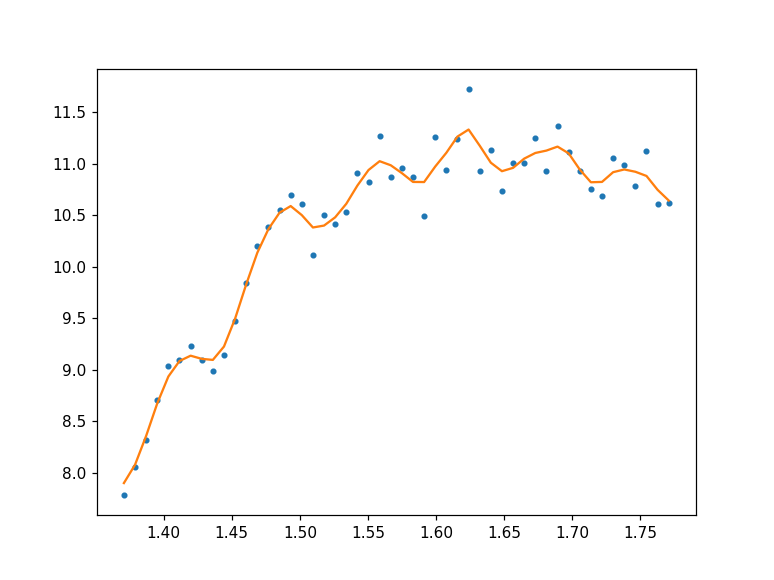

In [33]:
sq_sum_0_r, sq_sum_2_r = [],[]
rotations_r = []
for rot in np.linspace(np.pi/2-0.2, np.pi/2+0.2, 50):
    fits, _ = fit_legendres_images(merged_images, merged_centers, np.array([0,2]), rad_inds,
            params.NradAzmBins, rotate=rot, rad_range=[75,150])
    final_fits = fits*np.expand_dims(q/atm_scattering, -1)[75:150]
    final_fits -= np.expand_dims(np.nanmean(final_fits[3:-2], 0), 0)
    rotations_r.append(rot)

    sq_sum_0_r.append(np.sum(final_fits[15:30,:,0]**2))
    sq_sum_2_r.append(np.sum(final_fits[15:30,:,1]**2))
    
    print("rotation ", rot)

rotations_r = np.array(rotations_r)
sq_sum_2_r = np.array(sq_sum_2_r)
sq_sum_0_r = np.array(sq_sum_0_r)
ratio_r = sq_sum_2_r/sq_sum_0_r
best_ind = np.argmax(ratio_r)
print("Largest ratio ", ratio_r[best_ind], rotations_r[best_ind])
plt.figure()
plt.plot(rotations_r, ratio_r, '.')
plt.plot(rotations_r, gaussian_filter1d(ratio_r, 1))

/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:141: RuntimeWarning: invalid value encountered in true_divide


rotation  1.3707963267948966
rotation  1.3789595921010191
rotation  1.3871228574071415
rotation  1.395286122713264
rotation  1.4034493880193863
rotation  1.411612653325509
rotation  1.4197759186316312
rotation  1.4279391839377538
rotation  1.436102449243876
rotation  1.4442657145499986
rotation  1.4524289798561212
rotation  1.4605922451622435
rotation  1.468755510468366
rotation  1.4769187757744884
rotation  1.485082041080611
rotation  1.4932453063867333
rotation  1.5014085716928558
rotation  1.5095718369989781
rotation  1.5177351023051007
rotation  1.525898367611223
rotation  1.5340616329173455
rotation  1.542224898223468
rotation  1.5503881635295904
rotation  1.558551428835713
rotation  1.5667146941418353
rotation  1.5748779594479578
rotation  1.5830412247540802
rotation  1.5912044900602027
rotation  1.599367755366325
rotation  1.6075310206724476
rotation  1.6156942859785701
rotation  1.6238575512846924
rotation  1.632020816590815
rotation  1.6401840818969373
rotation  1.648347347203

<IPython.core.display.Javascript object>


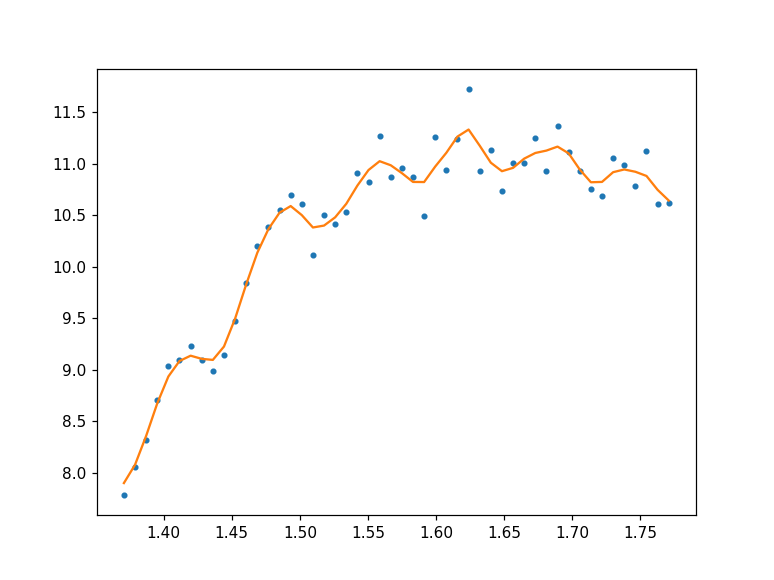

In [68]:
sq_sum_0_s, sq_sum_2_s = [],[]
rotations_s = []
for rot in np.linspace(np.pi/2-0.2, np.pi/2+0.2, 50):
    fits, _ = fit_legendres_images(merged_images, merged_centers, np.array([0,2]), rad_inds,
            params.NradAzmBins, rotate=rot, rad_range=[75,150])
    final_fits = fits*np.expand_dims(q/atm_scattering, -1)[75:150]
    final_fits -= np.expand_dims(np.nanmean(final_fits[3:-2], 0), 0)
    rotations_s.append(rot)

    sq_sum_0_s.append(np.sum(final_fits[15:30,:,0]**2))
    sq_sum_2_s.append(np.sum(final_fits[15:30,:,1]**2))
    
    print("rotation ", rot)

rotations_s = np.array(rotations_s)
sq_sum_2_s = np.array(sq_sum_2_s)
sq_sum_0_s = np.array(sq_sum_0_s)
ratio_s = sq_sum_2_s/sq_sum_0_s
best_ind = np.argmax(ratio_s)
print("Largest ratio ", ratio_r[best_ind], rotations_r[best_ind])
plt.figure()
plt.plot(rotations_s, ratio_s, '.')
plt.plot(rotations_s, gaussian_filter1d(ratio_s, 1))

In [11]:
qbin_stt = 100
qbin_end = 300
align_fits = fit_legendres(images, nanMaps, np.array([2]), rad_inds, ref_rad_pixs=ref_radial_pixels, ref_rad_nans=ref_radial_nanMap)
align_fits = gaussian_filter1d(np.squeeze(align_fits)[:,:,qbin_stt:qbin_end], 2, -1)
align_fits /= np.reshape(atm_scattering[qbin_stt:qbin_end]/q[qbin_stt:qbin_end], (1, 1, qbin_end-qbin_stt))

print(align_fits.shape)             

(14, 37, 200)


In [12]:
shifts = np.zeros(images.shape[0]).astype(int)
itr_shift = np.arange(5).astype(int) -  2
stt = 13
end = 29
scan_inds = np.arange(images.shape[0]).astype(int)
#np.random.seed(42)
for i in range(4):
    np.random.shuffle(scan_inds)
    mask = np.sum(
        np.array([align_fits[ii,stt+ss:end+ss] for ii,ss in enumerate(shifts)]),
        0)
    for sc in scan_inds:
        max_overlap = -1*np.inf
        best_shift = None
        for sft in itr_shift:
            overlap = np.sum(mask*align_fits[sc,stt+sft+shifts[sc]:end+sft+shifts[sc]])
            #if sc == 10:
            #    np.sum(mask)
            #    print(sft, np.sum(mask), overlap, overlap > max_overlap)
            if overlap > max_overlap:
                max_overlap = overlap
                best_shift = sft
                #print('bs', overlap,best_shift)
        shifts[sc] += best_shift
    """
    tmp = np.concatenate([np.expand_dims(
            align_fits[ii,stt+ss:end+ss], 0) for ii,ss in enumerate(shifts)],
            axis=0)
    var = np.var(tmp, axis=0)
    mean = np.mean(tmp, axis=0)
    comp = np.sum(np.abs(var))
    print(comp)
    fig,ax = plt.subplots()
    plt_fits = []
    for k in scan_inds:
        plt_fits.append(align_fits[k,stt+shifts[k]:end+shifts[k]]/atm_norm[0])
    print(np.mean(np.array(plt_fits), 0).shape)
    a = ax.pcolormesh(np.mean(np.array(plt_fits), 0))
    #a = ax.pcolormesh(var)
    fig.colorbar(a,ax=ax)
    """

In [13]:
itr_shift = np.arange(9) - 4
mask = np.sum(
    np.array([align_fits[ii,stt+ss:end+ss] for ii,ss in enumerate(shifts)]),
    0)
print(images_171.shape)
align_171_fits = fit_legendres(images_171, nanMaps_171, np.array([2]), rad_inds, ref_rad_pixs=ref_radial_pixels, ref_rad_nans=ref_radial_nanMap)
print(align_171_fits.shape)

align_171_fits = gaussian_filter1d(align_171_fits[:,:,qbin_stt:qbin_end,0], 2, -1)
align_171_fits /= np.reshape(atm_scattering[qbin_stt:qbin_end]/q[qbin_stt:qbin_end], (1, 1, qbin_end-qbin_stt))

max_overlap = -1*np.inf
shift_171 = None
for sft in itr_shift:
    overlap = np.sum(mask*align_fits[0,stt+sft:end+sft])

    if overlap > max_overlap:
        max_overlap = overlap
        shift_171 = sft
print(shift_171)



(1, 35, 1024, 1024)
(1, 35, 375, 1)
1


In [14]:
min_shift = np.amin(shifts)
max_shift = np.amax(shifts)

shift_dict = {
    171  :  shift_171
}
for i,sc in enumerate(scans):
    shift_dict[sc] = shifts[i]

fName = os.path.join(base_dir, molecule, "preProcessing", "Run-"+run, "Scan_t0Shifts.pl")
with open(fName, "wb") as file:
    pl.dump(shift_dict, file)

# Looking At Raw Data

(37, 1024, 1024)


<IPython.core.display.Javascript object>


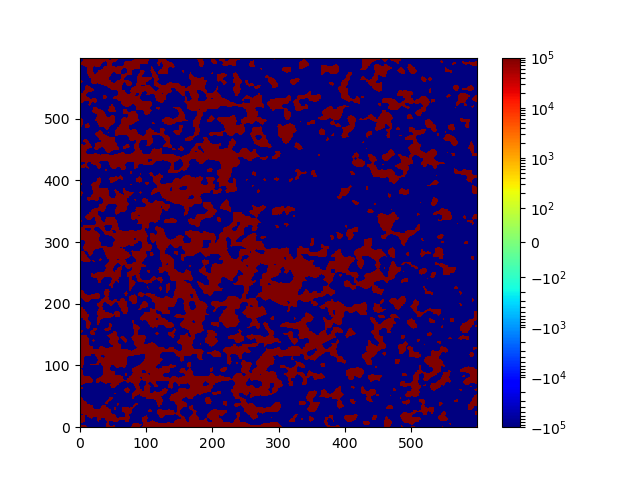

1821169019216.3713


/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:20: MatplotlibDeprecationWarning: default base will change from np.e to 10 in 3.4.  To suppress this warning specify the base keyword argument.
/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:20: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:20: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


<IPython.core.display.Javascript object>


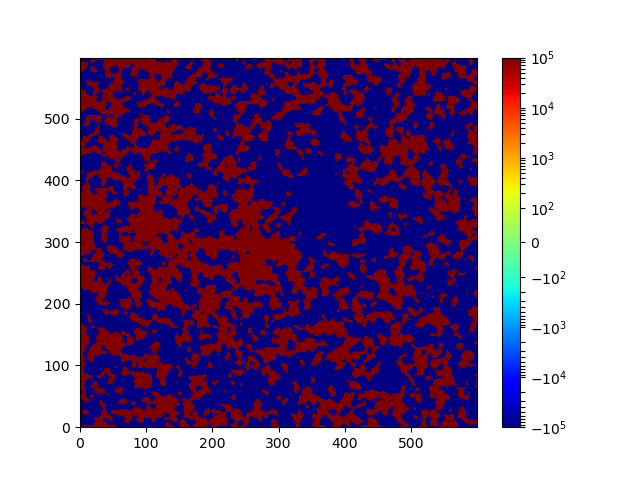

-2249091617822.056


<IPython.core.display.Javascript object>


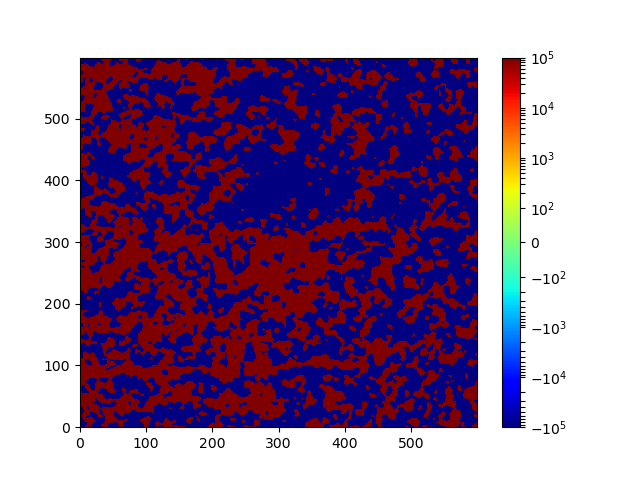

1359918901164.7957


<IPython.core.display.Javascript object>


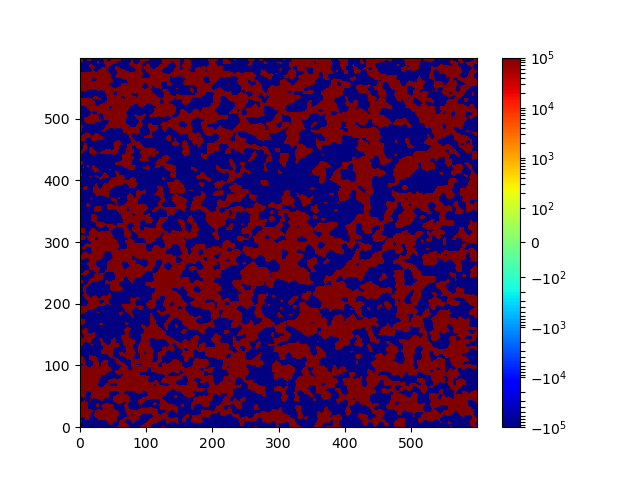

1048614712888.242


<IPython.core.display.Javascript object>


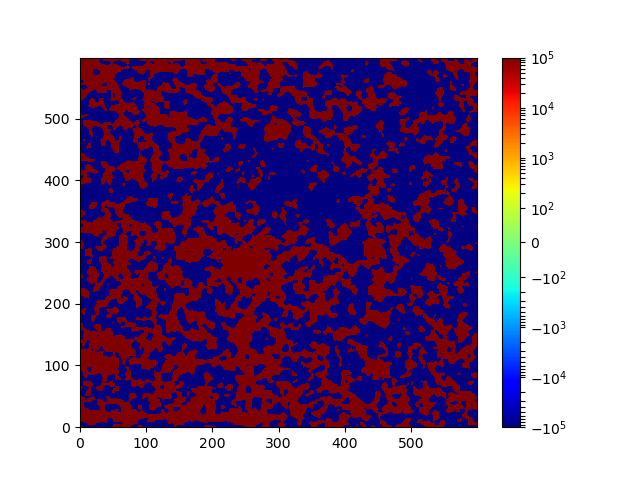

2335763054698.9946


<IPython.core.display.Javascript object>


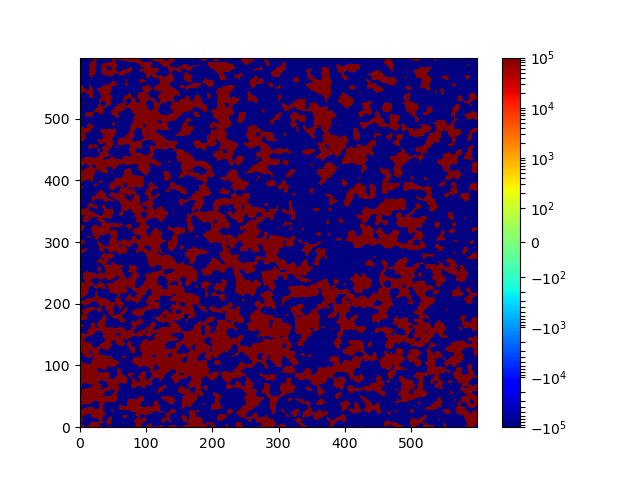

-430933242700.5449


<IPython.core.display.Javascript object>


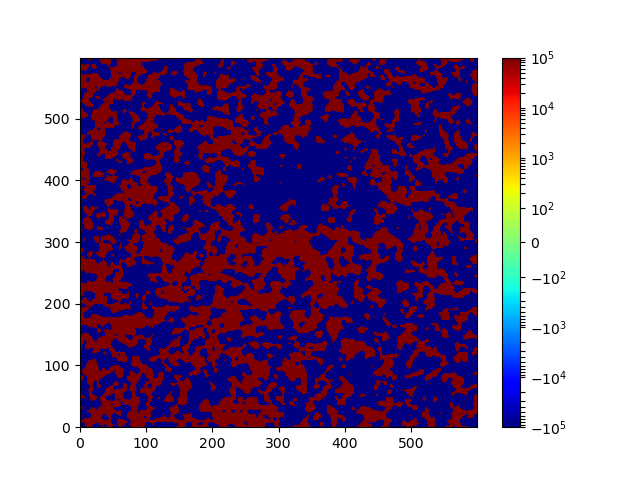

-740074015322.5217


<IPython.core.display.Javascript object>


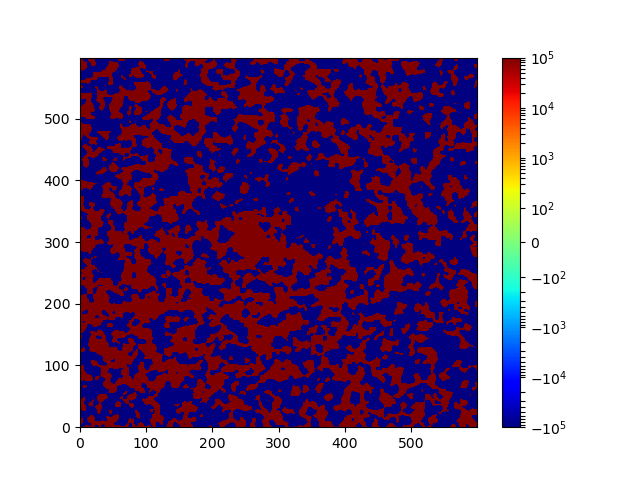

-2067582685273.9612


<IPython.core.display.Javascript object>


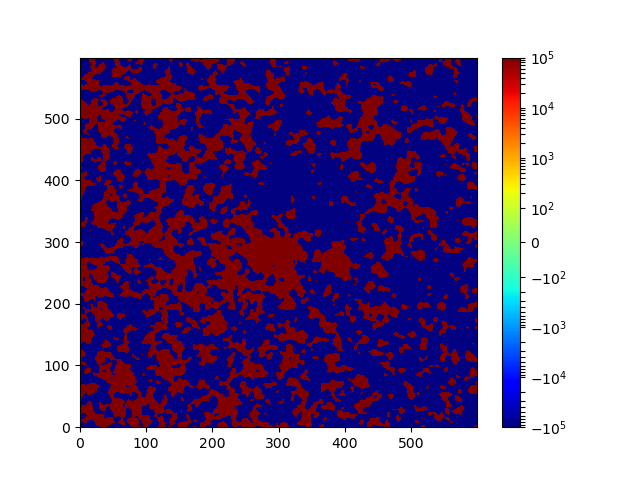

871547681135.9202


<IPython.core.display.Javascript object>


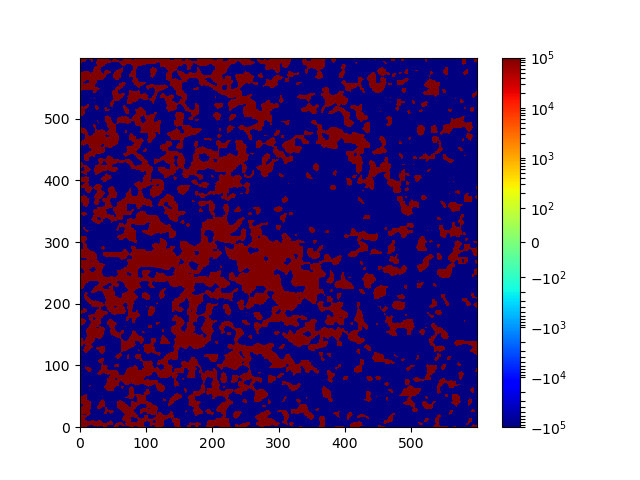

-678640092822.3759


<IPython.core.display.Javascript object>


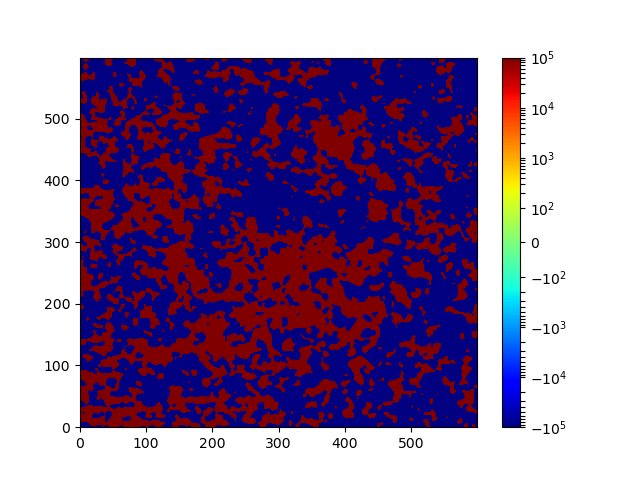

975345124501.2308


<IPython.core.display.Javascript object>


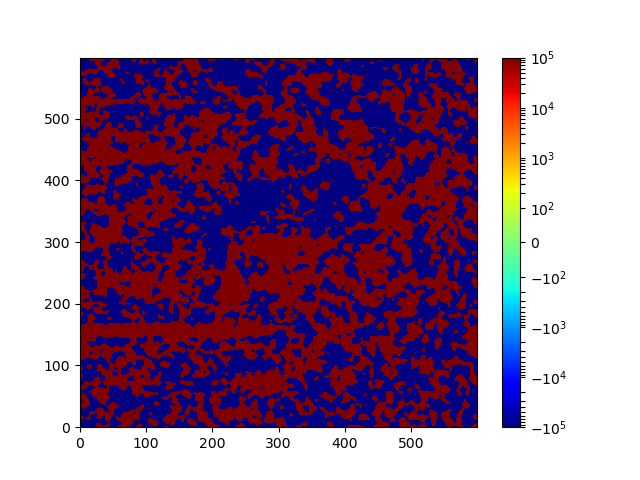

-569478534936.012


<IPython.core.display.Javascript object>


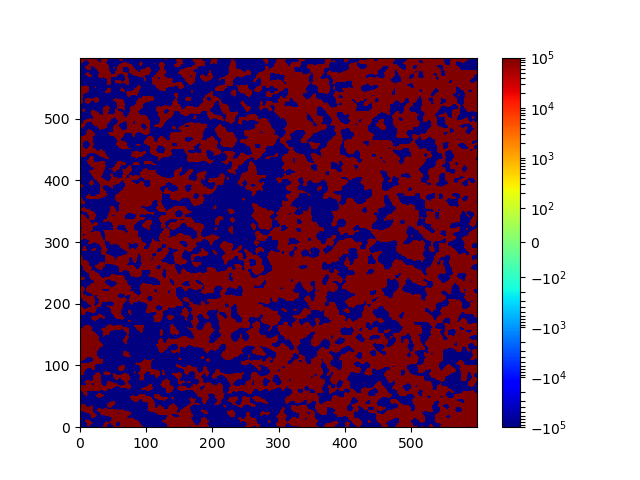

1558293420288.004


<IPython.core.display.Javascript object>


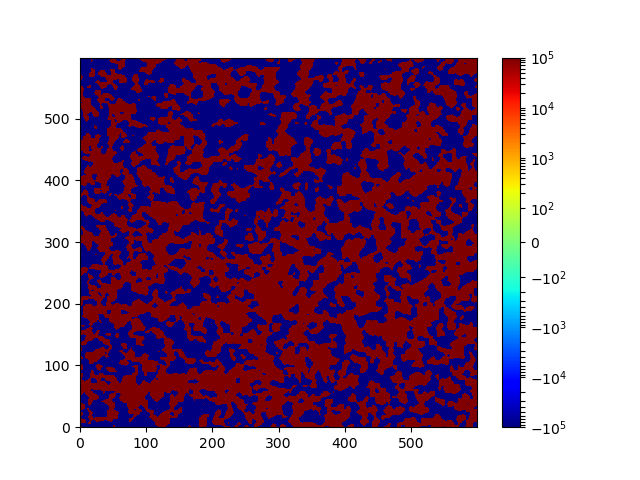

-3117320734830.9243


<IPython.core.display.Javascript object>


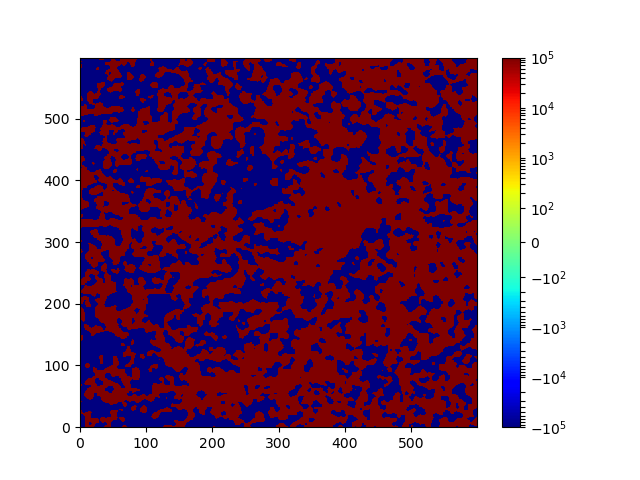

1068198261335.4865


<IPython.core.display.Javascript object>


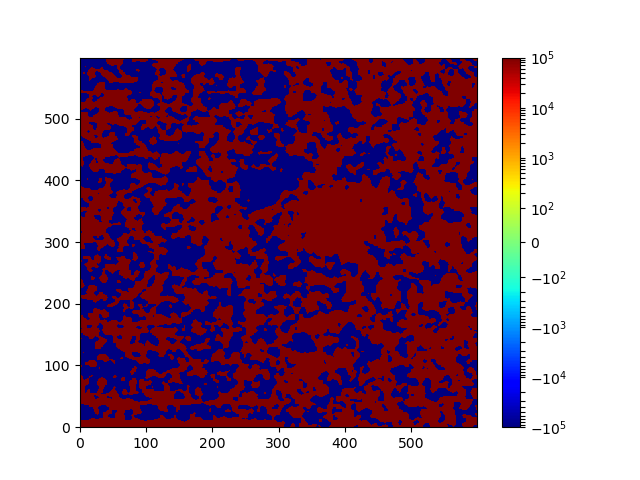

-1215481891941.0957


<IPython.core.display.Javascript object>


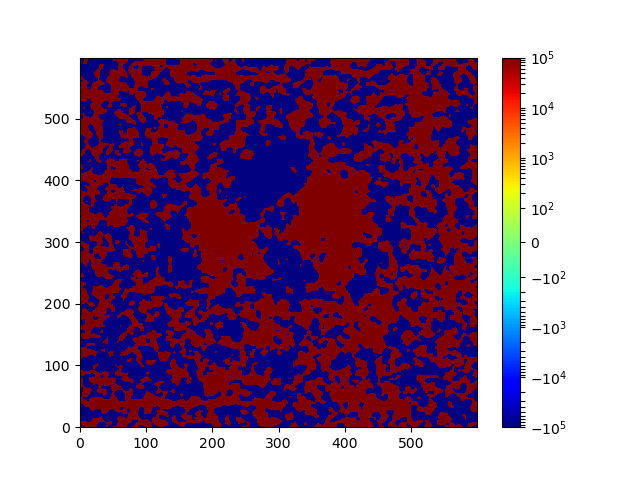

62703915567.53907


<IPython.core.display.Javascript object>


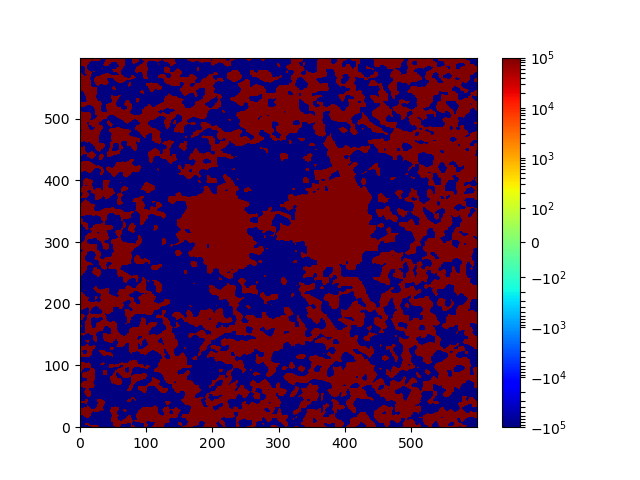

-1875872007450.222


<IPython.core.display.Javascript object>


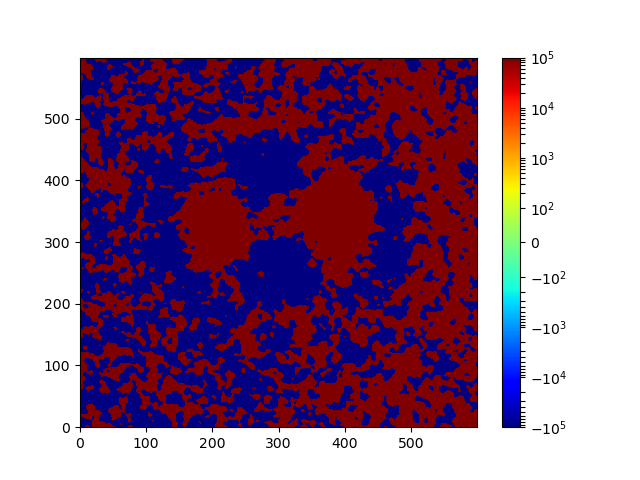

908581996695.151


/reg/g/psdm/sw/conda2/inst/envs/ps-3.0.15/lib/python3.7/site-packages/ipykernel/__main__.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


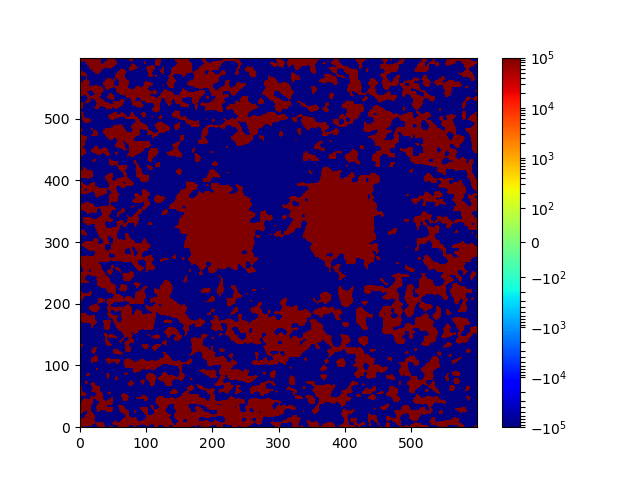

-2289678480691.133


<IPython.core.display.Javascript object>


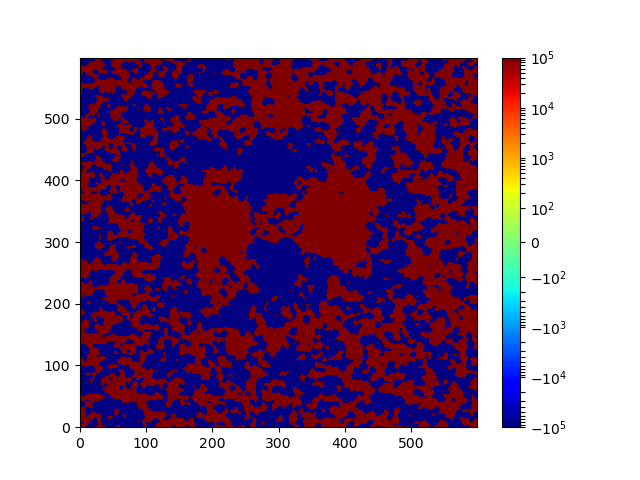

-107186074959.17809


<IPython.core.display.Javascript object>


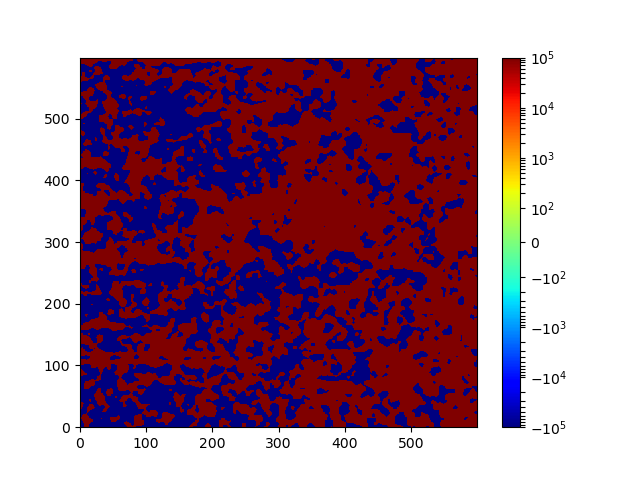

417414356402.94525


<IPython.core.display.Javascript object>


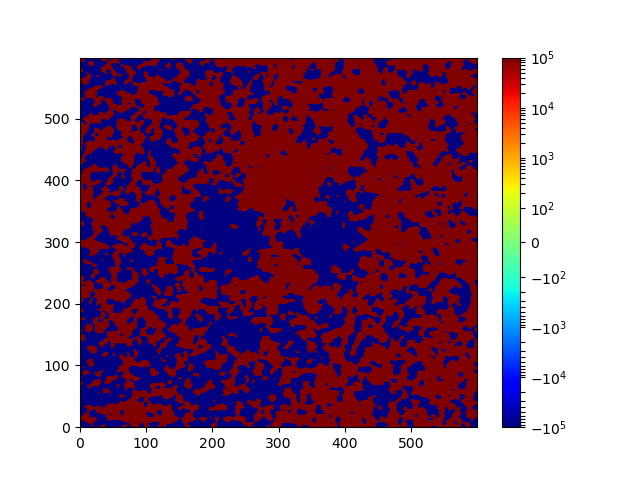

958558382640.9618


<IPython.core.display.Javascript object>


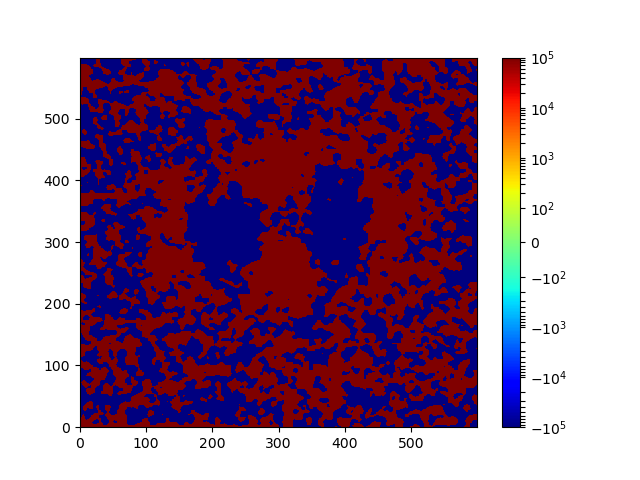

-892343170007.6674


<IPython.core.display.Javascript object>


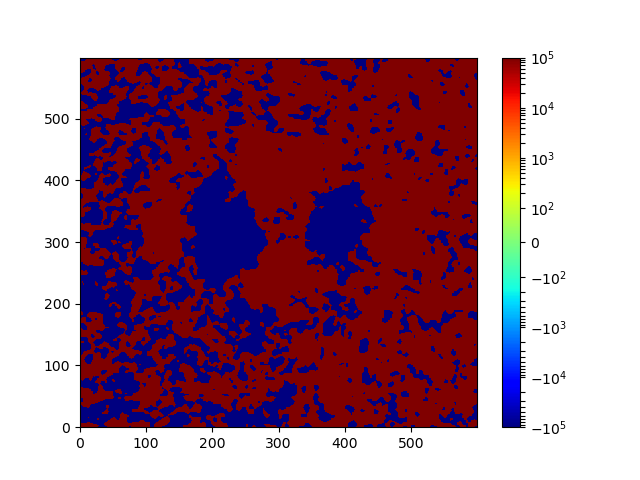

557486862037.5435


<IPython.core.display.Javascript object>


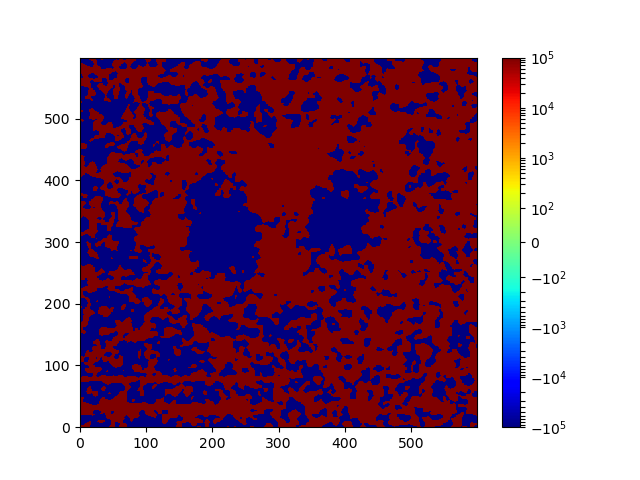

572777099162.9893


<IPython.core.display.Javascript object>


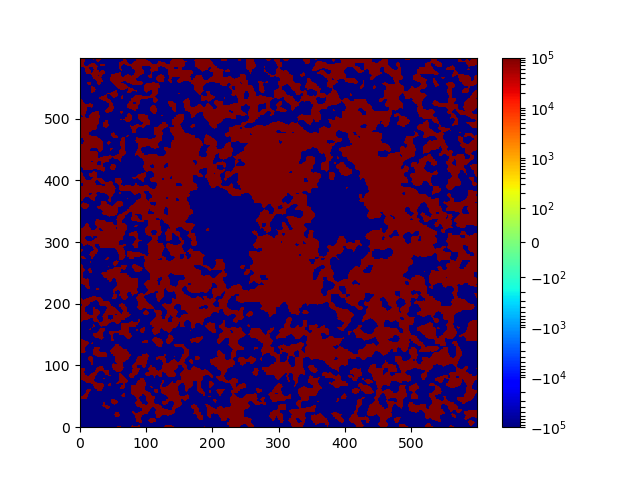

1456075595929.7363


<IPython.core.display.Javascript object>


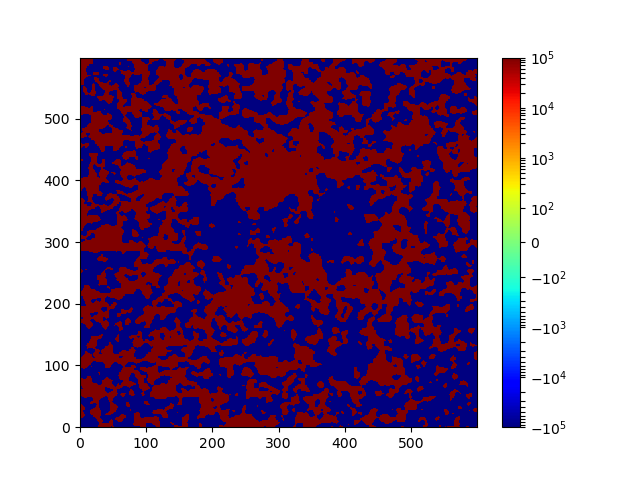

1042688296352.3656


<IPython.core.display.Javascript object>


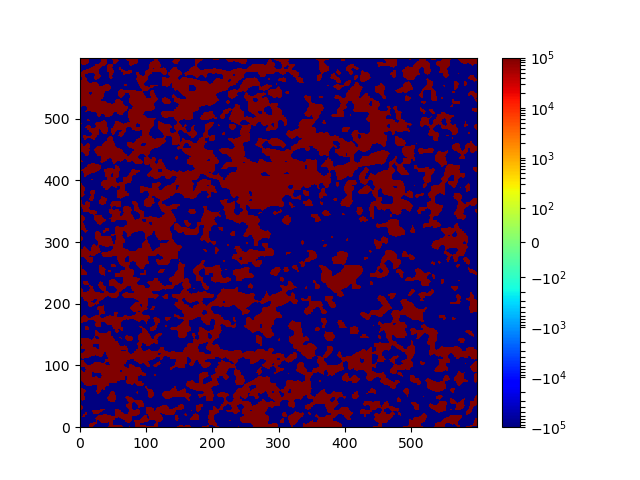

694277337284.1964


<IPython.core.display.Javascript object>


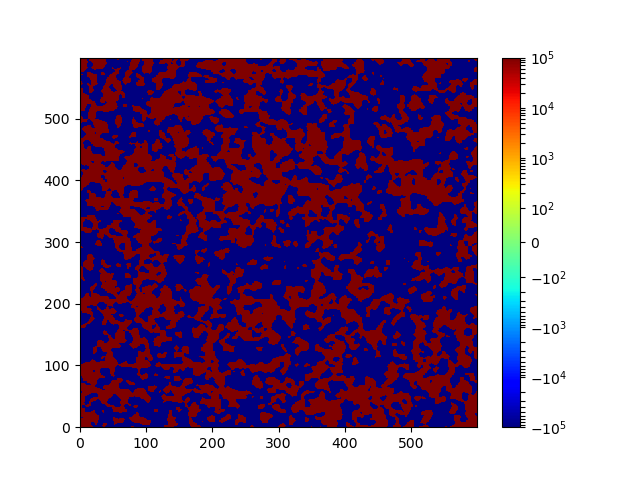

-1476801930400.0574


<IPython.core.display.Javascript object>


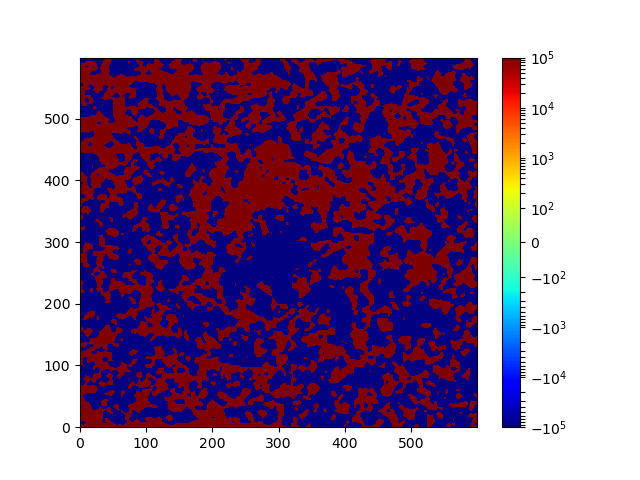

524645620677.9783


<IPython.core.display.Javascript object>


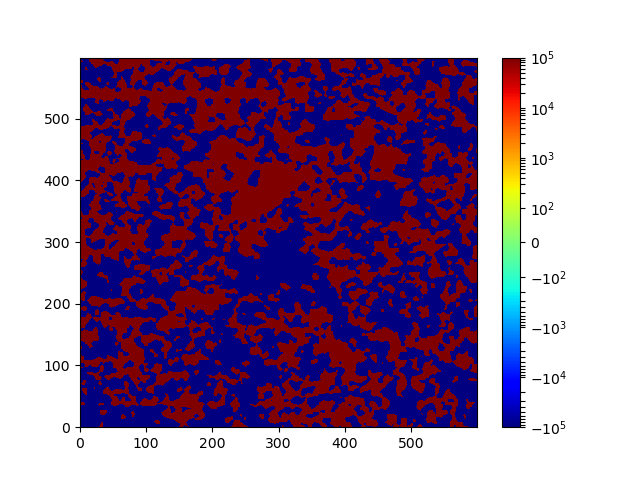

-694969002325.4573


<IPython.core.display.Javascript object>


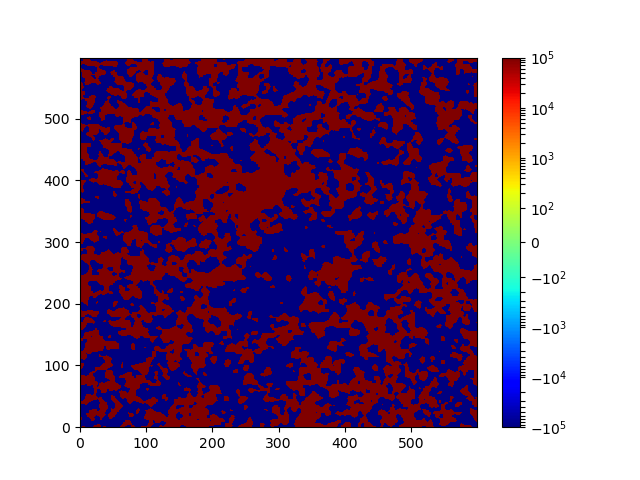

-1939162867955.6619


<IPython.core.display.Javascript object>


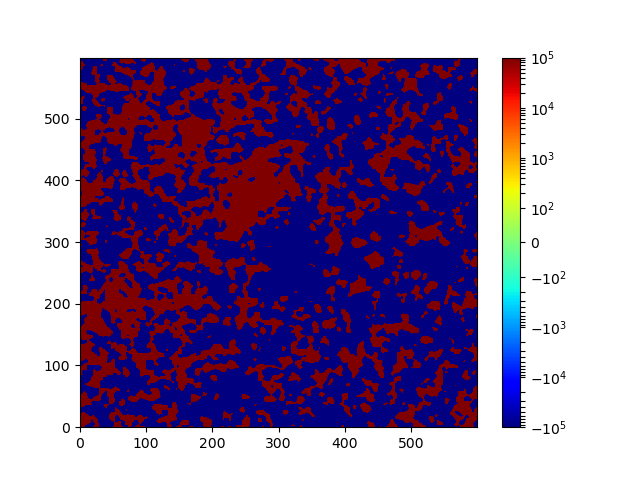

-574007190080.3616


<IPython.core.display.Javascript object>


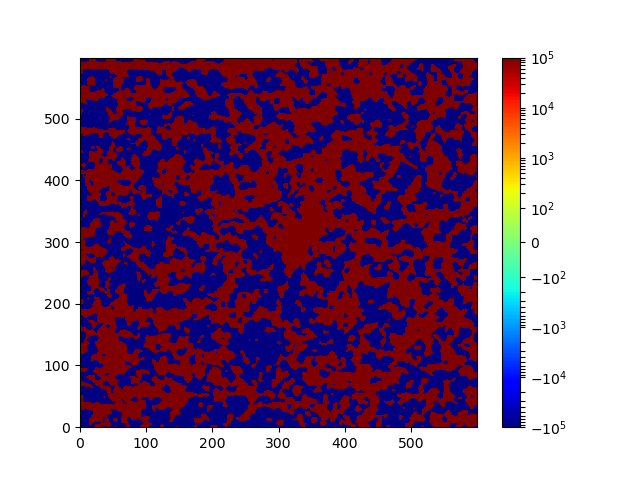

881287228090.9812


<IPython.core.display.Javascript object>


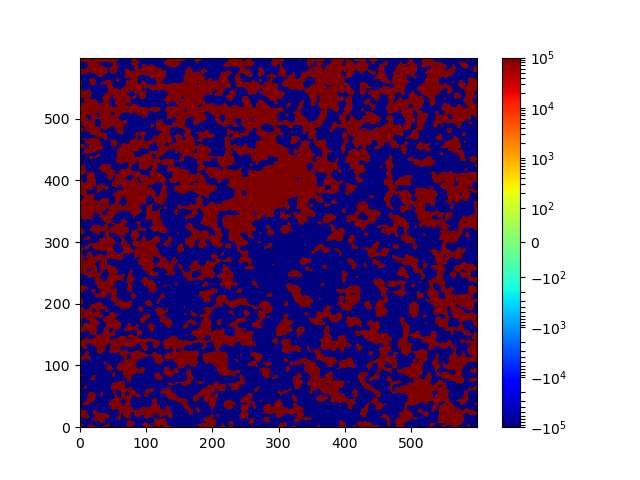

-60977768734.87078


<IPython.core.display.Javascript object>


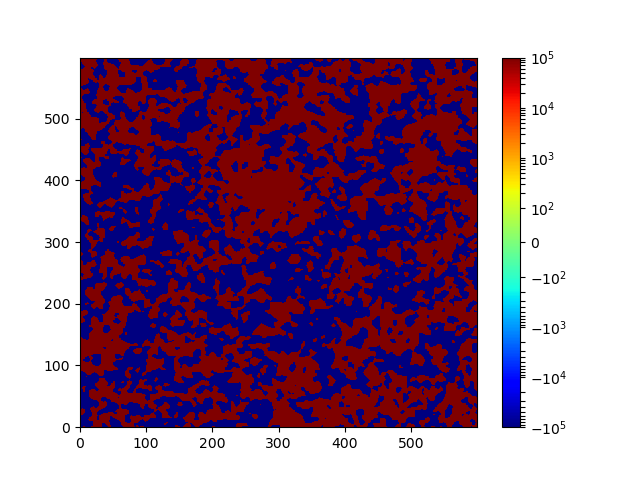

1864254442182.6768


In [67]:
"""
norm_mask = np.ones((800,800))
cutR = np.arange(200) + 300
for i in cutR:
    for j in cutR:
        norm_mask[i,j] = 0
norm = np.sum(np.sum(images[:,:,100:900,100:900]*norm_mask, -1), -1)

im = np.mean(images/np.reshape(norm, (14,37,1,1)), 0)
"""
im = np.mean(images, 0) - np.mean(ref_images, 1)
print(im.shape)

im -= np.expand_dims(np.mean(im, 0), 0)
im *= 10**10
x,y = np.meshgrid(np.arange(600), np.arange(600))
for i in range(im.shape[0]):
    fig,ax = plt.subplots()
    a = ax.pcolormesh(x,y,gaussian_filter(im[i,200:800,200:800], 3),
        norm=colors.SymLogNorm(linthresh=100), cmap="jet", vmin=-10**5, vmax=10**5)
    print(im[i,480,500])
    fig.colorbar(a, ax=ax)
    
    
    

# Plots that may help

In [ ]:
rads = np.arange(10)*10 + 150
print(merged_images.shape)

for rad in rads:
    fig,ax = plt.subplots(1,2,figsize=(10,5))
    aa = merged_images_std[17,rad_inds[rad][0]+375,rad_inds[rad][1]+375]
    bb = merged_images[17,rad_inds[rad][0]+375,rad_inds[rad][1]+375]
    aa = aa[np.invert(np.isnan(bb))]
    bb = bb[np.invert(np.isnan(bb))]
    
    
    ax[0].hist(aa, bins=100)
    ax[1].hist(bb, bins=100)
    fig.suptitle("rad {}".format(rad))

In [ ]:
rads = np.arange(10)*10 + 150
print(merged_images.shape)

for rad in rads:
    fig,ax = plt.subplots(1,2,figsize=(10,5))
    aa = merged_images_std[17,rad_inds[rad][0],rad_inds[rad][0]]
    bb = merged_images[17,rad_inds[rad][0],rad_inds[rad][0]]
    bb = bb[aa > 0]
    aa = aa[aa > 0]
    
    ax[0].hist(aa, bins=100)
    ax[1].hist(bb, bins=100)
    fig.suptitle("rad {}".format(rad))

In [ ]:
rad = 210
ar = merged_images[17,rad_inds[rad][0],rad_inds[rad][0]]
print(np.sum(merged_images[17,rad_inds[rad][0],rad_inds[rad][0]] < -40))
print(ar[ar<-40])



fig,ax = plt.subplots(1,2,figsize=(15,5))
im = copy(merged_images[17])
im[im>-46.05347] = np.nan
im[im<-46.05349] = np.nan
a = ax[0].pcolormesh(im)
fig.colorbar(a,ax=ax[0])
im = copy(merged_images[16])
im[im>-43] = np.nan
im[im<-45] = np.nan
a = ax[1].pcolormesh(im)
fig.colorbar(a,ax=ax[1])

In [ ]:
for itm in range(10,21):
    fig,ax = plt.subplots(1, 3, figsize=(18,6))
    a0 = ax[0].pcolormesh(merged_images[itm], vmin=-2*10**3, vmax=2*10**3,
            norm=colors.SymLogNorm(linthresh=100), cmap='seismic')
    fig.colorbar(a0, ax=ax[0])
    a1 = ax[1].pcolormesh(merged_images_std[itm], vmin=0, vmax=1.5*10**3,
            norm=colors.SymLogNorm(linthresh=100), cmap='jet')
    fig.colorbar(a1, ax=ax[1])
    a2 = ax[2].pcolormesh(merged_images[itm]/merged_images_std[itm], vmin=0, vmax=3, cmap='jet')
    fig.colorbar(a2, ax=ax[2])

    #        norm=colors.SymLogNorm(linthresh=100), cmap='jet')
    #rat = merged_images[itm]/merged_images_std[itm]
    #rat[np.isnan(rat)] = -0.2
    #ax[3].hist(rat)

# Notes

Graphic showing folding into quadrants and how we do not double count even though we have removed half of the image. This is important when finding the offset angle of the laser polarization that determines theta=0 for the legendre pattern.